# [CPD22-7a] LocalCongruence
## Progetto a cura di:
###       Gabriele Romualdi 521111
###       Simone Chilosi 522155
<br><br>
### Link Github: https://github.com/Panemiele/LarCongruence.jl

# Global Set up
Prima di lanciare gli esempi, verrà preparato l'ambiente adatto: si importano le librerie necessarie al corretto funzionamento, quali: LinearAlgebraicRepresentation, LarCongruence, ViewerGL.
Successivamente, viene definita una versione migliorata della funzione **chainCongruence()**: le modifiche apportate fanno si che essa si comporti in modo adeguato su input di grandi dimenzioni.<br><br>Dopo il set up, si è pronti a lanciare gli esempi in tutta libertà.

In [1]:
using BenchmarkTools
using ViewerGL, LinearAlgebra
using LinearAlgebraicRepresentation
using NearestNeighbors, DataStructures, SparseArrays
using StatsAPI
using SparseMM
using LarCongruence
using Images
using Colors
using Plots
using Base.Threads
using SparseArrays
using DataStructures
using NearestNeighbors
using LinearAlgebra
nthreads()

1

In [2]:
Lar= LinearAlgebraicRepresentation;
L = Lar;
LC = LarCongruence;
using ViewerGL;
GL = ViewerGL;

### Chain Congruence - Versioni normale e migliorata
Prima di proseguire con gli esempi, verranno definite le funzioni utilizzate per calcolare la congruenza; in particolare, vengono proposte due versioni:
* **chainCongruenceAA()**, versione normale della funzione, basata su Array of Arrays;
* **chainCongruenceAA_OPT()**, versione migliorata della precedente funzione.<br>
La funzione chainCongruenceAA_OPT() è stata migliorata aggiungendo a **cellCongruenceAA_OPT()** l'utilizzo dei tasks, precisamente nel primo for: quì vengono scorse le classi di vertices (se viene chiamata cellCongruenceAA_OPT(T\[1\],vclasses) ) o di edges (se invece viene chiamata cellCongruenceAA(T\[2\],eclasses); la cardinalità di vclasses, per esempio, è pari al numero di vertici della geometria, perciò più grande questa è grande, maggiore è la necessità di rendere asincrona questa porzione di codice. 

In [3]:
function vertCongruenceAA(W)
	err, i, todelete, vclasses = 10^-6, 1, [], []
	verts = convert(Lar.Points, W')
	kdtree = NearestNeighbors.KDTree(verts)
	newverts = zeros(Int, size(verts,2))
	for vi in 1:size(verts,2)
		if !(vi in todelete)
			nearvs = NearestNeighbors.inrange(kdtree, verts[:,vi], err)
			push!(vclasses,nearvs)
			newverts[nearvs] .= i
			nearvs = setdiff(nearvs, vi)
			todelete = union(todelete, nearvs)
			i += 1
		end
	end
	V = zeros(3,length(vclasses))
	for (k,class) in enumerate(vclasses)
		V[:,k] = sum(W[class,:],dims=1)/length(class)
	end
	return V, vclasses
end


function cellCongruenceAA(Delta,inclasses)
	cellarray = Lar.cop2lar(Delta)
	new_e = Array{Int64,1}(undef,size(Delta,2))
	for (k,class) in enumerate(inclasses)
		for e in class
			new_e[e] = k
		end
	end
  cells = [map(e->new_e[e], face) for face in cellarray]
  outclasses = DefaultOrderedDict{Array{Int64,1},Array{Int64,1}}([])
  for (k,face) in enumerate(cells)
    if outclasses[face] == []
    	outclasses[face] = [k]
    else
    	append!(outclasses[face],[k])
    end
  end
	FEnew = sort(collect(keys(outclasses)))
  outclasses = sort(collect(values(outclasses)))
  return FEnew,outclasses
end


function chainCongruenceAA(W, T)
	V, vclasses = vertCongruenceAA(W)
	EV, eclasses = cellCongruenceAA(T[1],vclasses)
	FE, fclasses = cellCongruenceAA(T[2],eclasses)
	#@show size(V,2) - size(EV,1) + size(FE,1)
	return V,EV,FE
end


chainCongruenceAA (generic function with 1 method)

In [4]:
function vertCongruenceAA_OPT(W)
	err, i, todelete, vclasses = 10^-6, 1, [], []
	verts = convert(Lar.Points, W')
	kdtree = NearestNeighbors.KDTree(verts)
	newverts = zeros(Int, size(verts,2))
	for vi in 1:size(verts,2)
		if !(vi in todelete)
			nearvs = NearestNeighbors.inrange(kdtree, verts[:,vi], err)
			push!(vclasses,nearvs)
			newverts[nearvs] .= i
			nearvs = setdiff(nearvs, vi)
			todelete = union(todelete, nearvs)
			i += 1
		end
	end
	V = zeros(3,length(vclasses))
	for (k,class) in enumerate(vclasses)
		V[:,k] = sum(W[class,:],dims=1)/length(class)
	end
	return V, vclasses
end


function cellCongruenceAA_OPT(Delta,inclasses)
	cellarray = Lar.cop2lar(Delta)
	new_e = Array{Int64,1}(undef,size(Delta,2))
	@sync for (k,class) in enumerate(inclasses)
		@async for e in class
			new_e[e] = k
		end
	end
  cells = [map(e->new_e[e], face) for face in cellarray]
  outclasses = DefaultOrderedDict{Array{Int64,1},Array{Int64,1}}([])
  for (k,face) in enumerate(cells)
    if outclasses[face] == []
    	outclasses[face] = [k]
    else
    	append!(outclasses[face],[k])
    end
  end
	FEnew = sort(collect(keys(outclasses)))
  outclasses = sort(collect(values(outclasses)))
  return FEnew,outclasses
end


function chainCongruenceAA_OPT(W, T)
	V, vclasses = vertCongruenceAA_OPT(W)
	EV, eclasses = cellCongruenceAA_OPT(T[1],vclasses)
	FE, fclasses = cellCongruenceAA_OPT(T[2],eclasses)
	#@show size(V,2) - size(EV,1) + size(FE,1)
	return V,EV,FE
end


chainCongruenceAA_OPT (generic function with 1 method)

# <br><br><br><br><br><br><br><br><br><br><br><br><br><br><br>Example 1 - two intersecting cuboids grid
### Grid size: 3x3x3<br>Cells number: 27x2 = 54
Questo piccolo esempio è stato proposto per mostrare, innanzitutto, la corretta creazione delle griglie di input e la corretta visualizzazione dell'output. L'approccio seguito in questo esempio (la struttura dell'esempio stesso e l'utilizzo di ViewerGL) verrà riproposto anche nei successivi.<br>
Le due griglie, che differiscono leggermente di posizione e rotazione, sono intersecate fra loro e possiedono, in totale, un numero pari a 54 celle (27 per griglia). Data la traslazione e la rotazione di cui sopra, non è ancora possibile, in questo esempio, mostrare il comportamento della funzione **chainCongruence()**; tuttavia, rimane un buon esempio iniziale per comprendere il dominio applicativo.

In [5]:
V,(VV,EV,FV,CV) = Lar.cuboidGrid([3,3,3],true);
mybox = (V,CV,FV,EV);
twocubs = Lar.Struct([mybox, L.t(.3,.4,.5), L.r(pi/5,0,0), L.r(0,0,pi/12), mybox]);
V,CV,FV,EV = Lar.struct2lar(twocubs);

In [6]:
GL.VIEW([GL.GLGrid(V,EV, GL.COLORS[3], 0.5)]);

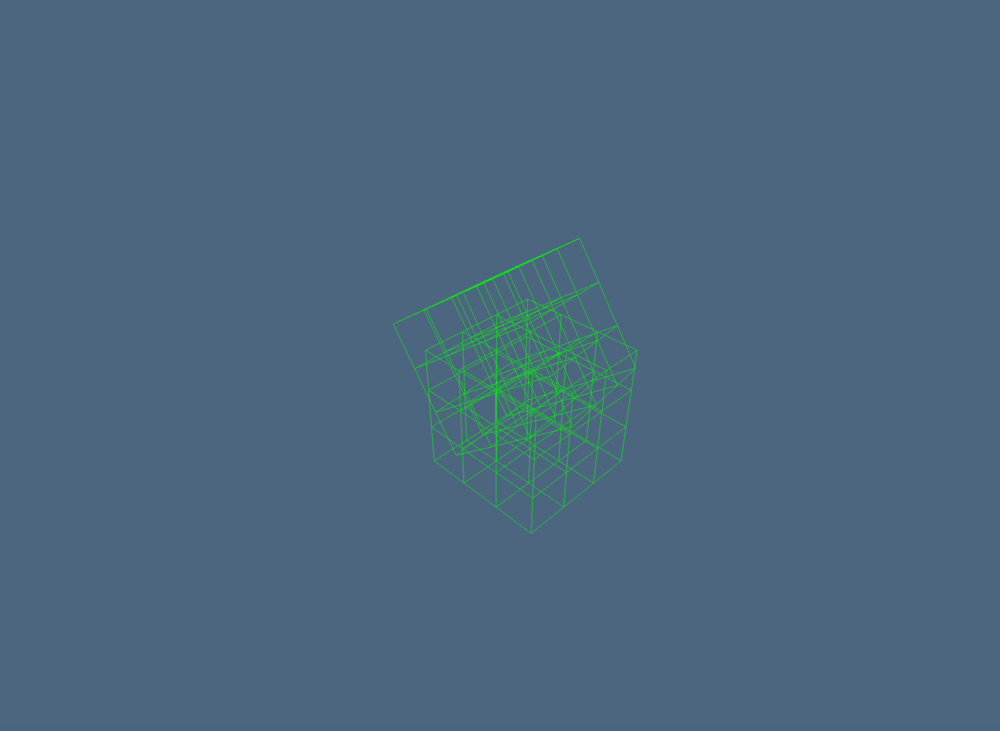

In [7]:
GL.VIEW([GL.GLGrid(V,FV, GL.COLORS[2], 0.5)]);

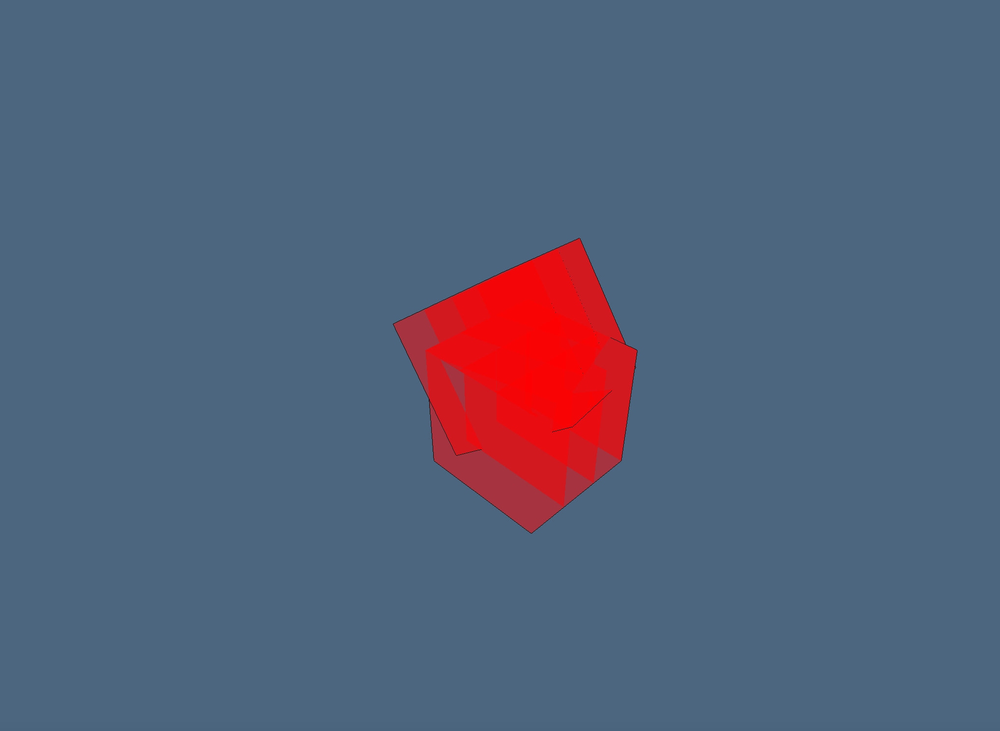

In [8]:
W = convert(Lar.Points, V');
cop_EV = Lar.coboundary_0(EV::Lar.Cells);
cop_EW = convert(Lar.ChainOp, cop_EV);
cop_FE = Lar.coboundary_1(V, FV::Lar.Cells, EV::Lar.Cells);
T = [cop_EV, cop_FE];

In [9]:
V, copEV, copFE, copCF = Lar.space_arrangement( W, cop_EW, cop_FE);

In [10]:
EV = Lar.cop2lar(copEV);
FE = Lar.cop2lar(copFE);
CF = Lar.cop2lar(copCF);
FV = [union([EV[e] for e in fe]...) for fe in FE];
CV = [union([FV[f] for f in cf]...) for cf in CF];
W = convert(Lar.Points, V');
WW = [[k] for k=1:size(W,2)];

#### Numerazione della geometria

In [11]:
GL.VIEW(GL.numbering(.5)((W,[WW,EV,FV,CV])));

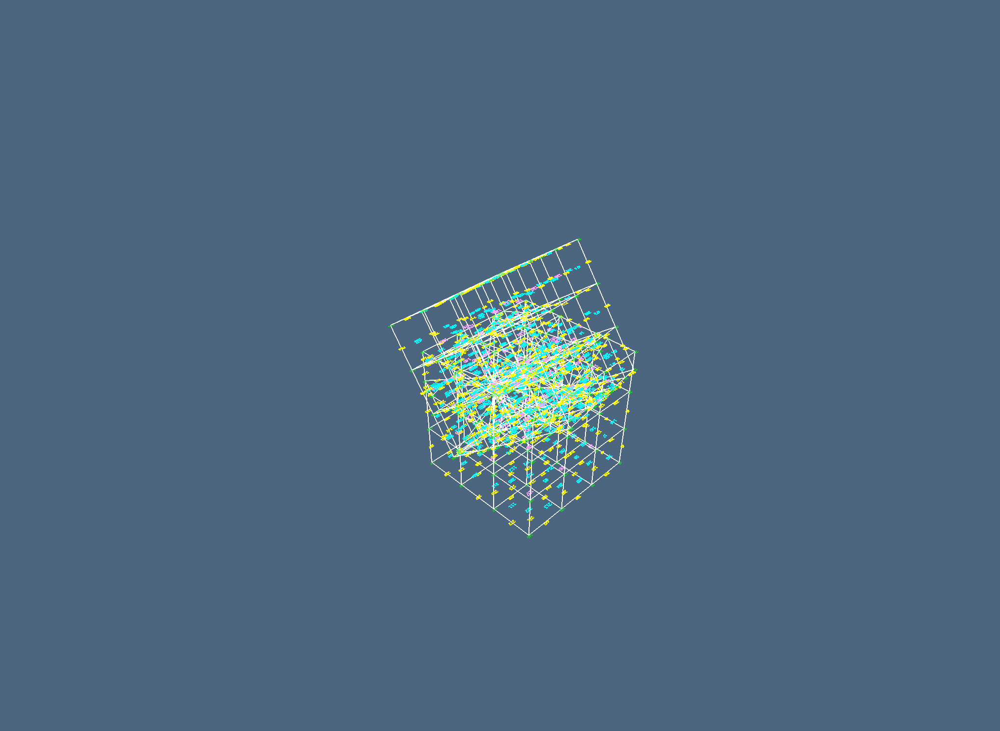

In [12]:
V,CVs,FVs,EVs = Lar.pols2tria(W, copEV, copFE, copCF);

.................................................................EVs = [[[1, 2], [3, 4], [1, 3], [2, 4]], [[2, 4], [2, 5], [4, 7], [5, 8], [7, 10], [8, 10]], [[6, 7], [6, 9], [7, 10], [9, 10]], [[8, 9], [8, 10], [9, 10]], [[5, 8], [5, 12], [8, 16], [12, 16]], [[6, 9], [6, 14], [9, 14]], [[8, 9], [13, 14], [13, 15], [8, 16], [9, 14], [15, 16]], [[11, 12], [11, 15], [12, 16], [15, 16]], [[3, 4], [17, 18], [3, 17], [4, 18]], [[4, 7], [4, 18], [18, 20], [7, 23], [20, 23]], [[19, 21], [19, 22], [21, 22]], [[6, 7], [20, 21], [6, 22], [7, 23], [21, 22], [20, 23]], [[6, 14], [6, 22], [22, 27], [14, 27]], [[24, 25], [24, 26], [25, 27], [26, 27]], [[13, 14], [13, 26], [26, 27], [14, 27]], [[19, 22], [19, 25], [25, 27], [22, 27]], [[17, 18], [28, 29], [17, 28], [18, 29]], [[18, 20], [18, 29], [29, 30], [30, 31], [31, 32], [20, 32]], [[20, 21], [21, 32], [20, 32]], [[19, 21], [19, 31], [31, 32], [21, 32]], [[19, 25], [19, 31], [34, 35], [34, 36], [31, 36], [25, 35]], [[24, 25], [24, 35], [25, 35]]

triangulated_faces = Any[[[3, 4, 2], [2, 1, 3]], [[5, 2, 8], [8, 2, 10], [10, 4, 7], [4, 10, 2]], [[9, 6, 7], [7, 10, 9]], [[10, 9, 8]], [[5, 8, 16], [16, 12, 5]], [[6, 9, 14]], [[13, 15, 8], [8, 15, 16], [8, 9, 14], [8, 14, 13]], [[11, 15, 16], [16, 12, 11]], [[3, 4, 18], [18, 17, 3]], [[18, 4, 23], [20, 18, 23], [7, 23, 4]], [[22, 21, 19]], [[23, 7, 22], [22, 7, 6], [21, 20, 23], [21, 23, 22]], [[27, 22, 6], [6, 14, 27]], [[24, 25, 27], [27, 26, 24]], [[26, 13, 14], [14, 27, 26]], [[22, 19, 27], [25, 27, 19]], [[28, 29, 18], [18, 17, 28]], [[29, 18, 30], [30, 18, 32], [32, 31, 30], [20, 32, 18]], [[21, 32, 20]], [[31, 32, 21], [21, 19, 31]], [[34, 35, 36], [36, 35, 25], [25, 19, 31], [25, 31, 36]], [[35, 25, 24]], [[34, 33, 36], [36, 33, 30], [36, 30, 31]], [[39, 43, 41], [43, 39, 37], [43, 38, 42], [38, 43, 37]], [[40, 41, 43], [43, 42, 40]], [[51, 50, 48], [48, 50, 45], [45, 46, 40], [42, 40, 46], [45, 40, 48]], [[52, 51, 48], [48, 49, 52]], [[38, 46, 42]], [[50, 45, 44]], [[49, 47

#### Rappresentazione grafica delle griglie (dopo la congruenza)

In [13]:
GL.VIEW(GL.GLExplode(V,FVs,1.2,1.2,1.2,99,1));
GL.VIEW(GL.GLExplode(V,EVs,1.2,1.2,1.2,99,1));
GL.VIEW(GL.GLExplode(V,CVs[2:end],5,5,5,99,0.5));

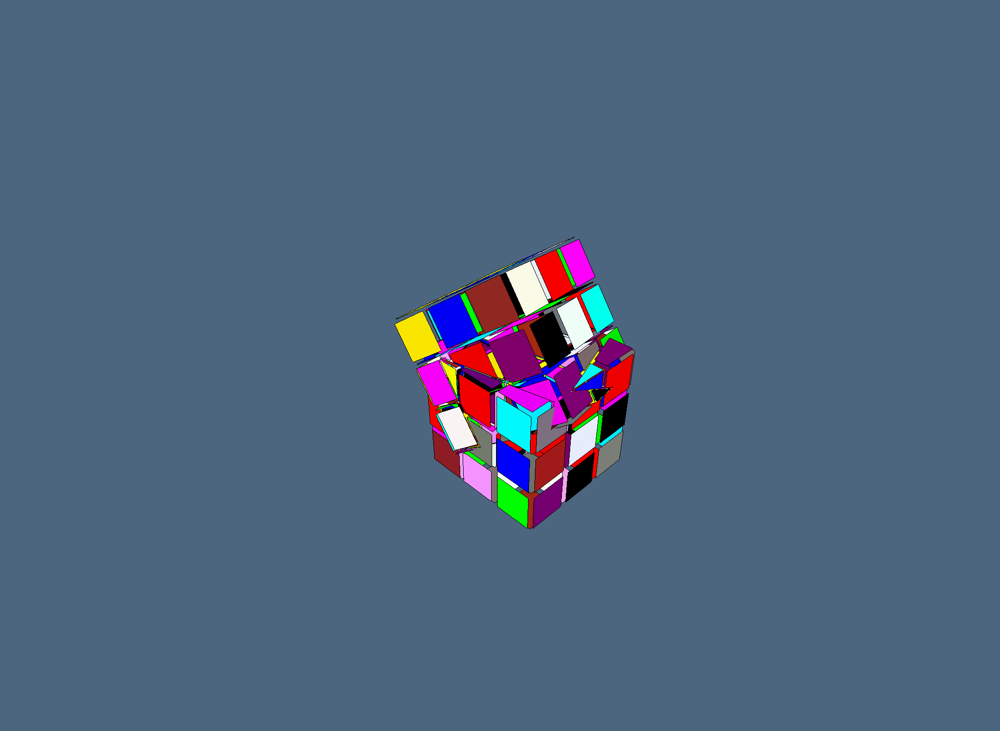

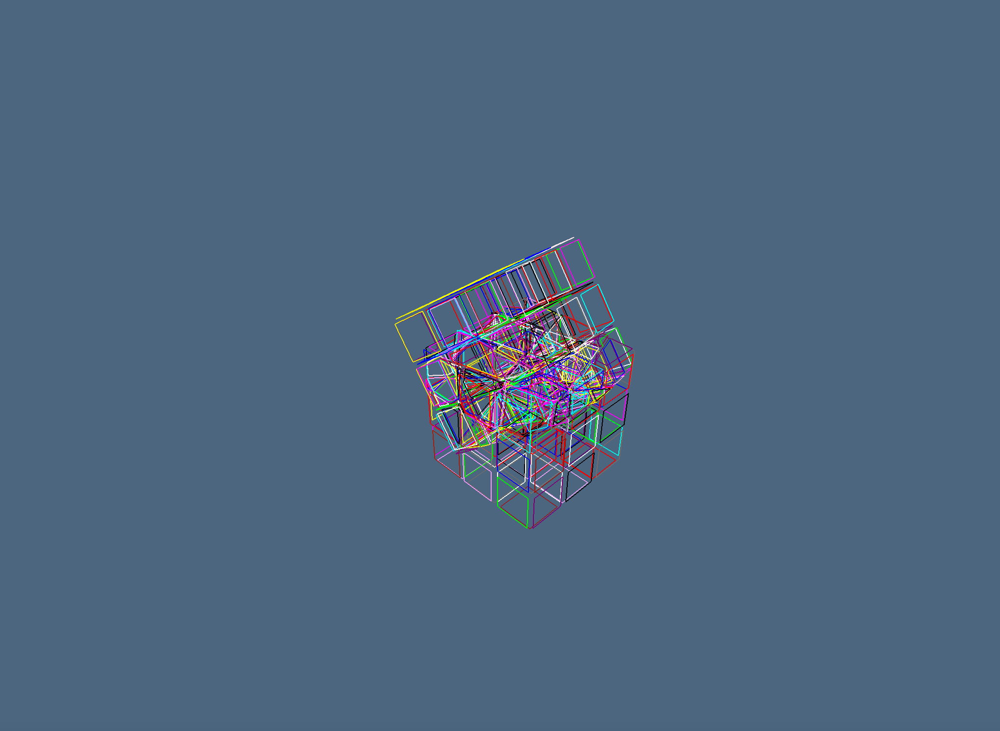

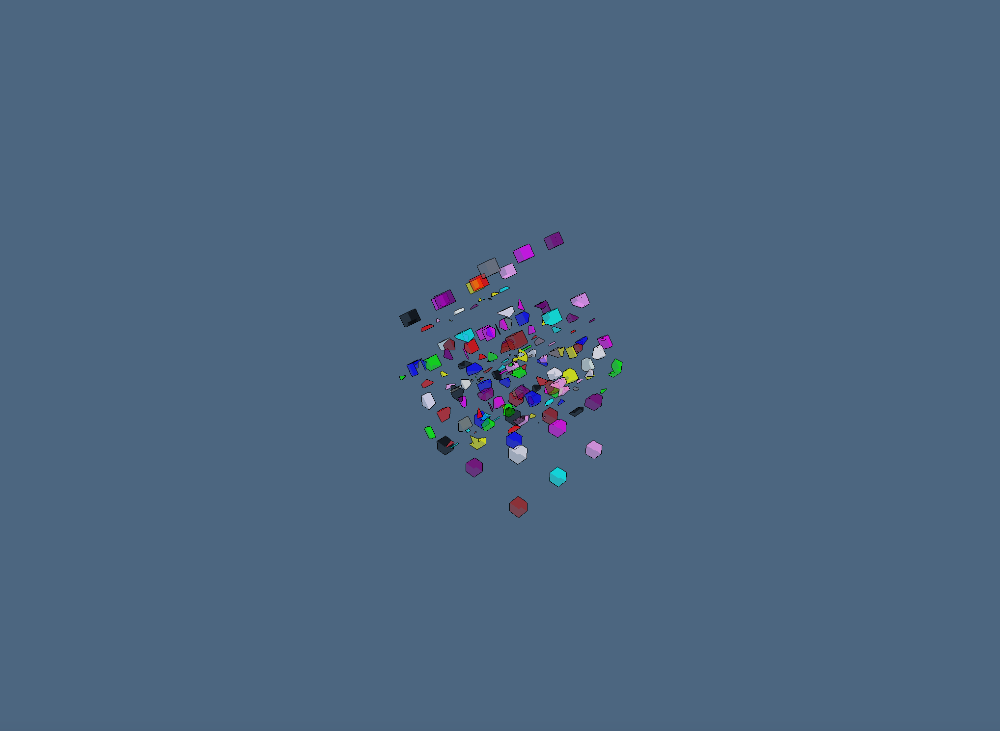

# <br><br><br><br><br><br><br><br><br><br><br><br><br><br><br>Example 2 - two adjacent cubes on faces
### Cubes number: 2
Quest'altro piccolo esempio permette di osservare il comportamento della funzione **chainCongruence()** in modo molto semplice.
* vengono creati due cubi adiacenti su una delle loro facce (verrà aggiunta una distanza di 0.0000001 tra un cubo ed un altro per evitare che la funzione **cuboid()** risolva la congruenza al posto della funzione **chainCongruence()**);
* tali cubi sono creati in modo separato, perciò **essi avranno i vertici e la faccia** su cui risultano adiacenti **duplicati**;
* godendo di queste caratteristiche, alla geometria può essere applicata la funzione **chainCongruence()** che fa si che i vertici e le facce duplicate vengano rimosse, mettendo "a fattor comune" vertici e facce su cui i cubi risultano adiacenti
Essendo due cubi, ci si aspetta di passare, per quanto riguarda il **numero di vertici distinti**, **da 16 a 12** mentre per le **facce distinte** ci si aspetta di passare **da 12** (6 per cubo) **a 8**: questo perché 4 vertici + 1 faccia sono in comune tra i due cubi e, perciò, la funzione utilizzata rimuoverà tali copie.

#### Creazione dei due cubi adiacenti

In [40]:
V,(VV,EV,FV,CV) = Lar.cuboid([1,true,1],true);
mybox = (V,CV,FV,EV);
twocubs = Lar.Struct([mybox, Lar.t(1,0,0), Lar.t(0.0000001, 0, 0), mybox]);
V,CV,FV,EV = Lar.struct2lar(twocubs);

#### Dimensione delle matrici EV e FV prima di ***chainCongruence()***

In [41]:
V

3×16 Matrix{Float64}:
 0.0  0.0  0.0  0.0  1.0  1.0  1.0  1.0  …  1.0  1.0  1.0  2.0  2.0  2.0  2.0
 0.0  0.0  1.0  1.0  0.0  0.0  1.0  1.0     0.0  1.0  1.0  0.0  0.0  1.0  1.0
 0.0  1.0  0.0  1.0  0.0  1.0  0.0  1.0     1.0  0.0  1.0  0.0  1.0  0.0  1.0

In [42]:
size(EV)

(24,)

In [43]:
size(FV)

(12,)

#### Rappresentazione grafica delle griglie

In [34]:
GL.VIEW([GL.GLGrid(V,EV, GL.COLORS[3], 0.5)]);

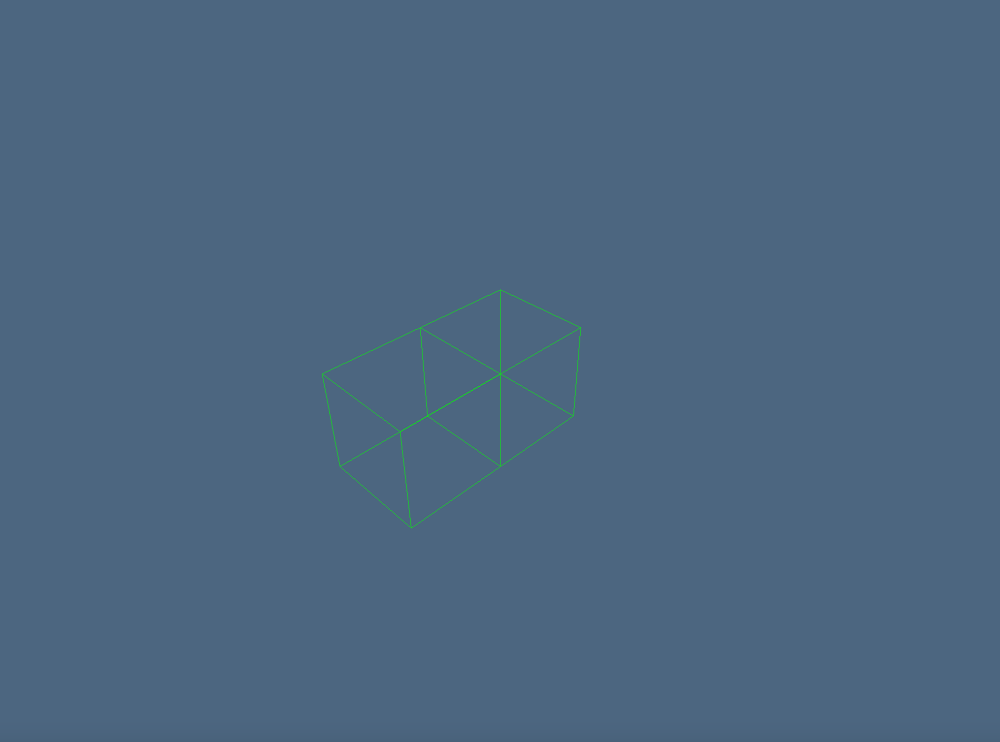

In [11]:
GL.VIEW([GL.GLGrid(V,FV, GL.COLORS[2], 0.5)]);

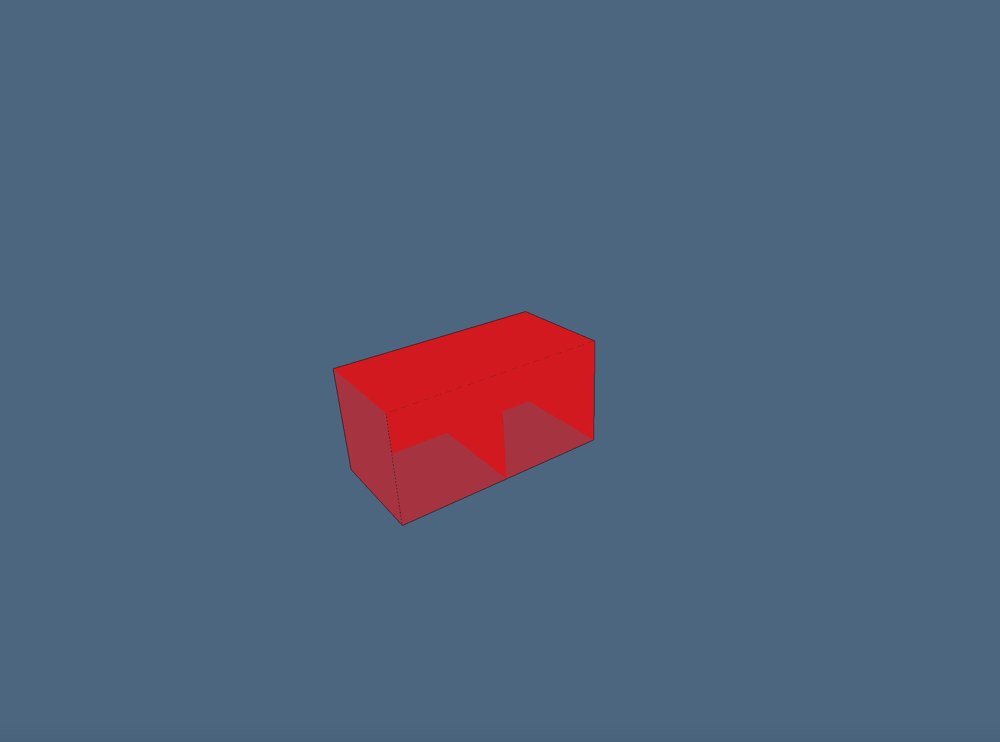

In [35]:
W = convert(Lar.Points, V');
cop_EV = Lar.coboundary_0(EV::Lar.Cells);
cop_EW = convert(Lar.ChainOp, cop_EV);
cop_FE = Lar.coboundary_1(V, FV::Lar.Cells, EV::Lar.Cells);
T = [cop_EV, cop_FE];

### Chain Congruence application
**Verrà ora dimostrato che la dimensione di EV ottenuto dopo la congruenza è minore rispetto a quello iniziale.**
Questo è dovuto al fatto che 4 vertici ed una faccia risultano duplicati e la funziona "chainCongruence()" li ha eliminati (come volevasi dimostrare: **EV - EV_B = 24 - 20 = 4** vertici doppioni eliminati).

In [44]:
V_B,EV_B,FE_B = chainCongruenceAA(W, T);

In [45]:
GL.VIEW([GL.GLGrid(V_B, EV_B, GL.COLORS[2], 1)]);

Come si può vedere, la griglia ottenuta è identica a quella di partenza, ma i vertici utilizzati per la sua creazione sono in numero minore.
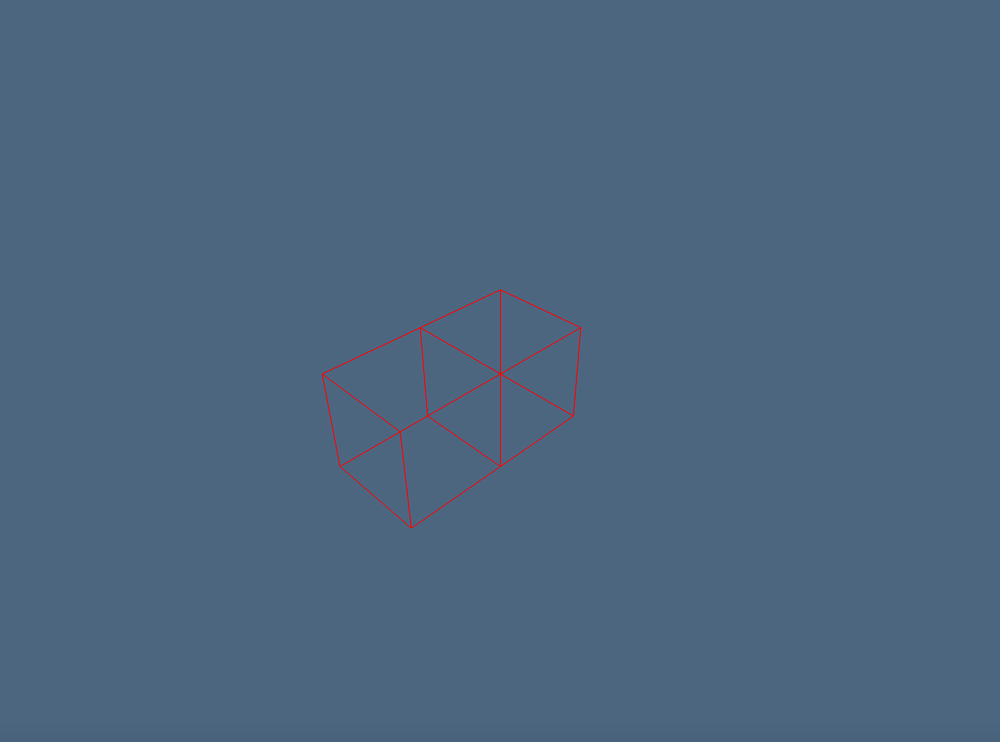

#### Confronto tra le matrici EV prima e dopo la congruenza

In [46]:
(size(EV,1), size(EV_B,1))

(24, 20)

In [47]:
size(EV) > size(EV_B)

true

#### Space arrangement e numerazione di vertici e facce della geometria

In [48]:
V, copEV, copFE, copCF = Lar.space_arrangement( W, cop_EW, cop_FE);

In [49]:
EV = Lar.cop2lar(copEV);
FE = Lar.cop2lar(copFE);
CF = Lar.cop2lar(copCF);
FV = [union([EV[e] for e in fe]...) for fe in FE];
CV = [union([FV[f] for f in cf]...) for cf in CF];
W = convert(Lar.Points, V');
WW = [[k] for k=1:size(W,2)];

In [50]:
GL.VIEW(GL.numbering(.5)((W,[WW,EV,FV,CV])));

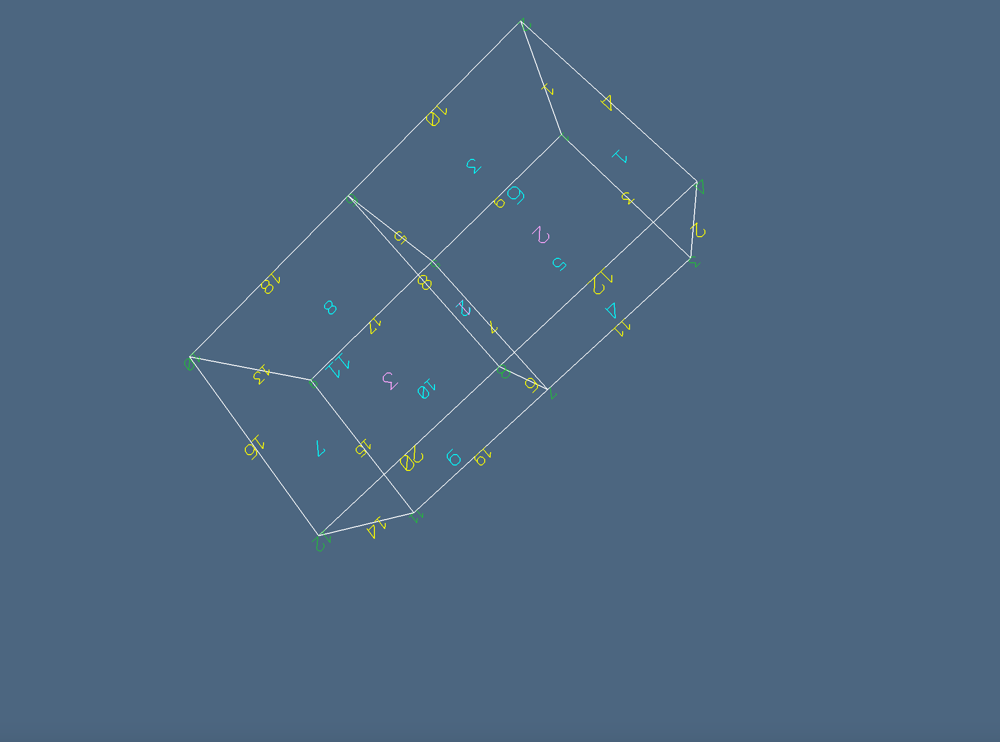

#### Rappresentazione finale dei vertici delle facce della geometria

In [51]:
V,CVs,FVs,EVs = Lar.pols2tria(W, copEV, copFE, copCF);

.EVs = [[[1, 2], [3, 4], [1, 3], [2, 4]], [[5, 6], [7, 8], [5, 7], [6, 8]], [[1, 2], [5, 6], [1, 5], [2, 6]], [[3, 4], [7, 8], [3, 7], [4, 8]], [[1, 3], [5, 7], [1, 5], [3, 7]], [[2, 4], [6, 8], [2, 6], [4, 8]], [[9, 10], [11, 12], [9, 11], [10, 12]], [[5, 6], [9, 10], [5, 9], [6, 10]], [[7, 8], [11, 12], [7, 11], [8, 12]], [[5, 7], [9, 11], [5, 9], [7, 11]], [[6, 8], [10, 12], [6, 10], [8, 12]]]
triangulated_faces = Any[[[3, 4, 2], [2, 1, 3]], [[7, 5, 6], [6, 8, 7]], [[1, 5, 6], [6, 2, 1]], [[4, 3, 8], [7, 8, 3]], [[1, 5, 7], [7, 3, 1]], [[4, 8, 2], [6, 2, 8]], [[11, 12, 9], [10, 9, 12]], [[9, 5, 6], [6, 10, 9]], [[8, 7, 11], [11, 12, 8]], [[9, 5, 7], [7, 11, 9]], [[8, 6, 10], [10, 12, 8]]]


In [52]:
GL.VIEW(GL.GLExplode(V,FVs,1.2,1.2,1.2,99,1));
GL.VIEW(GL.GLExplode(V,EVs,1.2,1.2,1.2,99,1));
GL.VIEW(GL.GLExplode(V,CVs[2:end],5,5,5,99,0.5));

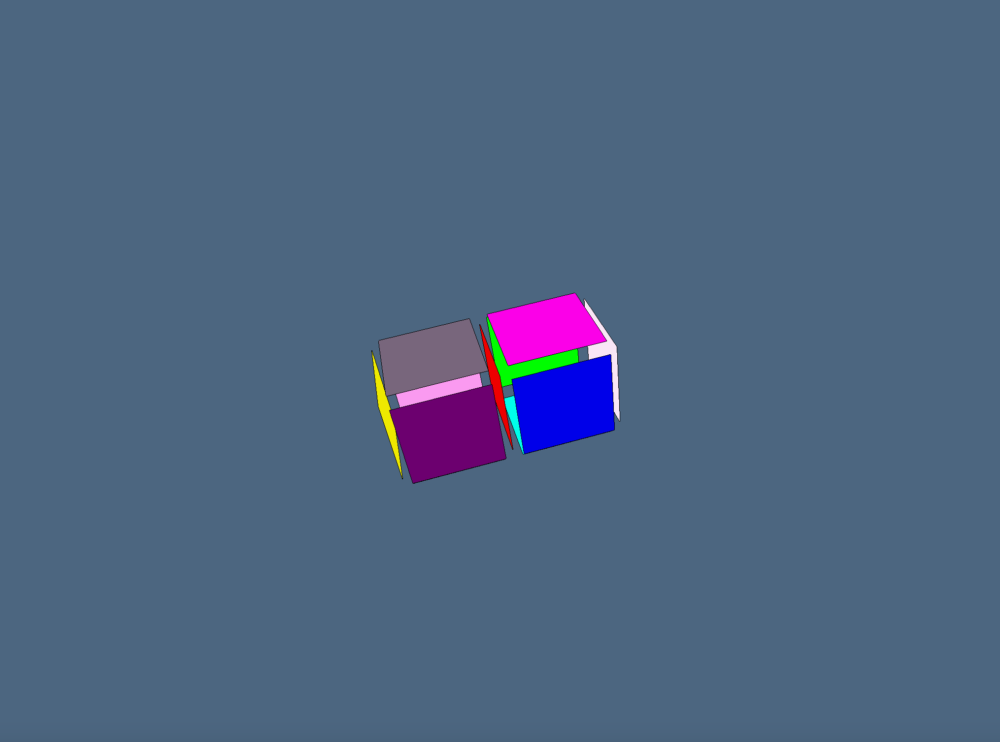

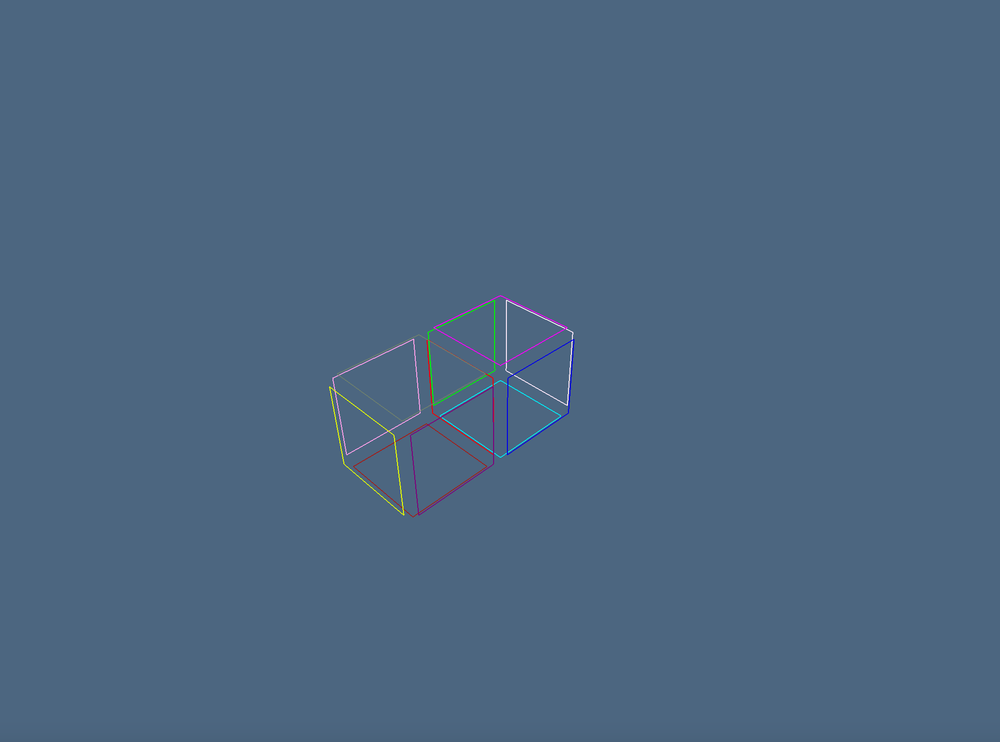

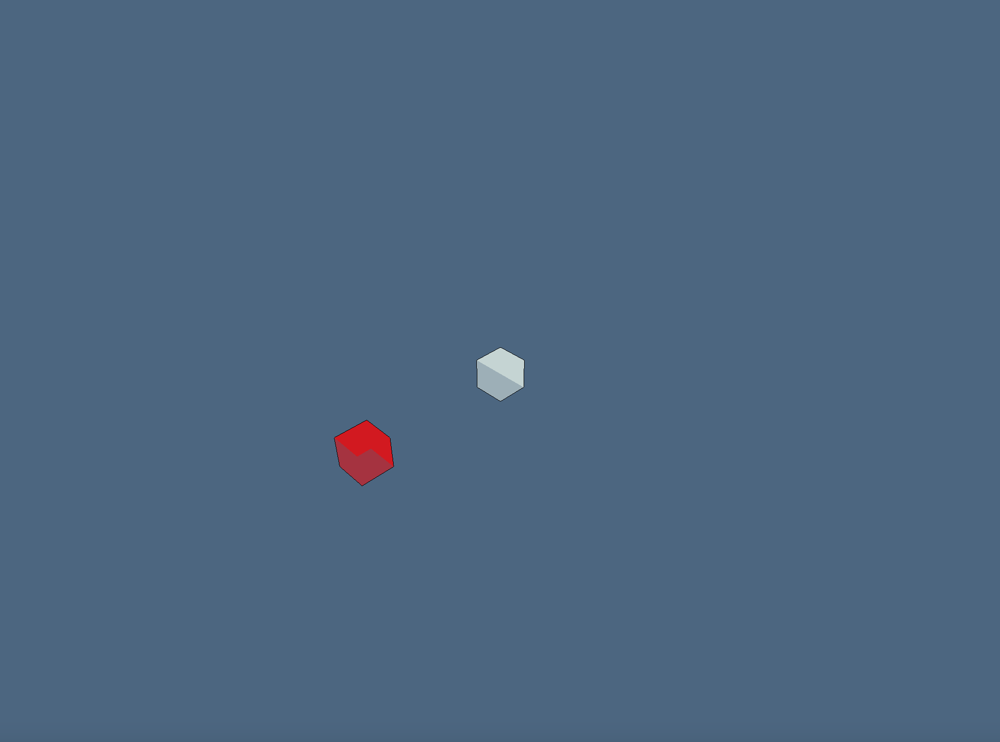

# <br><br><br><br><br><br><br><br><br><br><br><br><br><br><br>Example 3 - two adjacent cubes on the edges
### Cubes number: 2
Un altro esempio di dimensioni contenute; anche quì si osserva il comportamento della funzione **chainCongruence()**.
* vengono creati due cubi adiacenti su uno dei loro spigoli (verrà aggiunta una distanza di 0.0000001 tra un cubo ed un altro per evitare che la funzione **cuboid()** risolva la congruenza al posto della funzione **chainCongruence()**);
* tali cubi sono creati in modo separato, perciò **essi avranno lo spigolo** su cui risultano adiacenti **duplicato**;
* godendo di queste caratteristiche, alla geometria può essere applicata la funzione **chainCongruence()** che fa si che lo spigolo duplicato venga rimosso, mettendolo "a fattor comune".
Essendo due cubi, ci si aspetta di passare, per quanto riguarda il **numero di spigoli**, **da 24 a 23**: questo perché lo spigolo è in comune tra i due cubi e, perciò, la funzione utilizzata rimuoverà una delle due copie.

#### Creazione dei due cubi adiacenti

In [83]:
V,(VV,EV,FV,CV) = Lar.cuboid([1,true,1],true);
mybox = (V,CV,FV,EV);
twocubs = Lar.Struct([mybox, Lar.t(1,0,0), Lar.t(0.0000001, 0, 0), Lar.r(pi/2,0,0), mybox]);
V,CV,FV,EV = Lar.struct2lar(twocubs);

#### Dimensione delle matrici EV e FV prima di ***chainCongruence()***

In [85]:
size(EV)

(24,)

In [86]:
size(FV)

(12,)

#### Rappresentazione grafica delle griglie

In [87]:
GL.VIEW([GL.GLGrid(V,EV, GL.COLORS[3], 0.5)]);

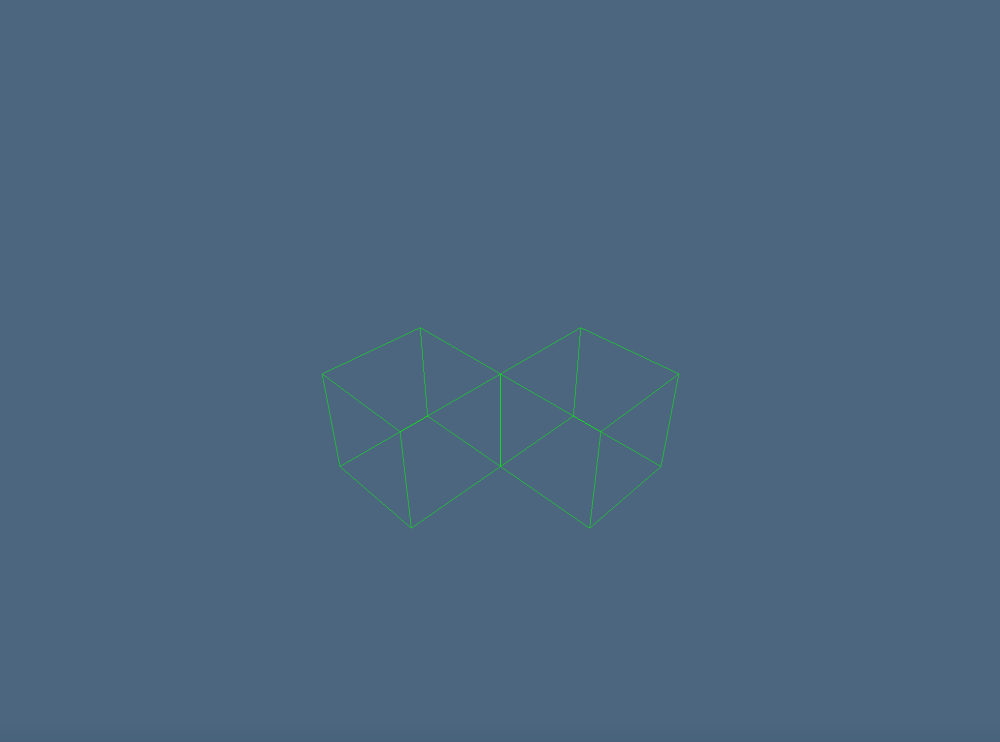

In [100]:
GL.VIEW([GL.GLGrid(V,FV, GL.COLORS[2], 0.5)]);

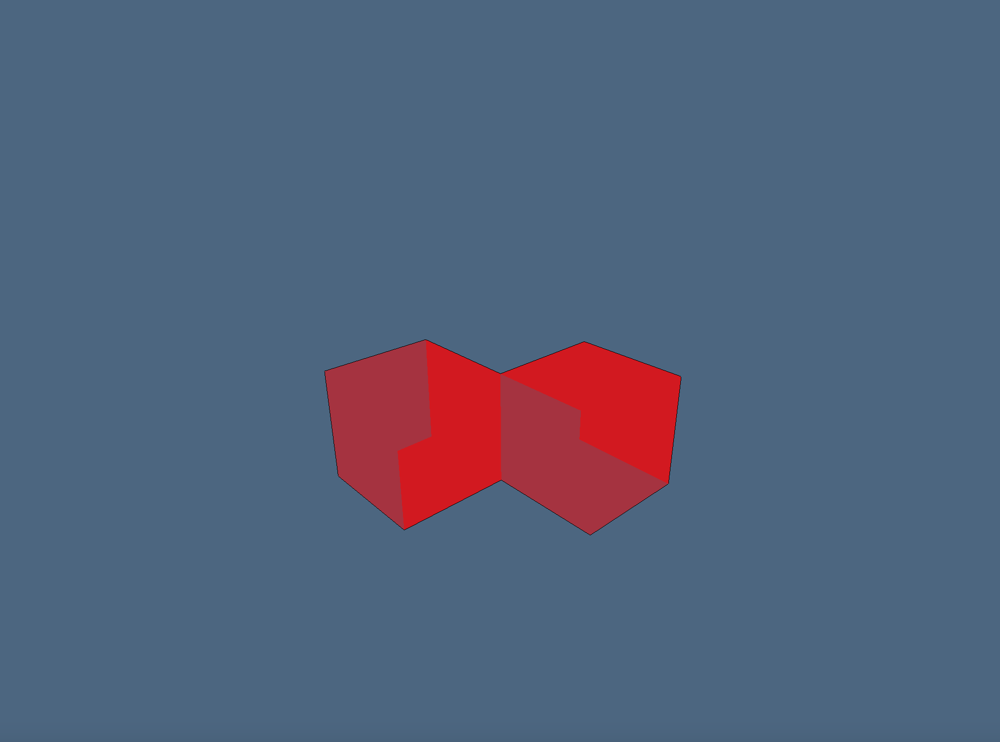

In [89]:
W = convert(Lar.Points, V');
cop_EV = Lar.coboundary_0(EV::Lar.Cells);
cop_EW = convert(Lar.ChainOp, cop_EV);
cop_FE = Lar.coboundary_1(V, FV::Lar.Cells, EV::Lar.Cells);
T = [cop_EV, cop_FE];

### Chain Congruence application
**Verrà ora dimostrato che la dimensione di EV ottenuto dopo la congruenza è minore rispetto a quello iniziale.**
Questo è dovuto al fatto che uno spigolo risulta duplicato e la funzione "chainCongruence()" lo ha eliminato (come volevasi dimostrare: **EV - EV_B = 24 - 23 = 1** spigolo doppione eliminato).

In [90]:
V_B,EV_B,FE_B = chainCongruenceAA(W, T);

In [91]:
GL.VIEW([GL.GLGrid(V_B, EV_B, GL.COLORS[2], 1)]);

Come si può vedere, la griglia ottenuta è identica a quella di partenza, ma i vertici in EV utilizzati per la sua creazione sono in numero minore.
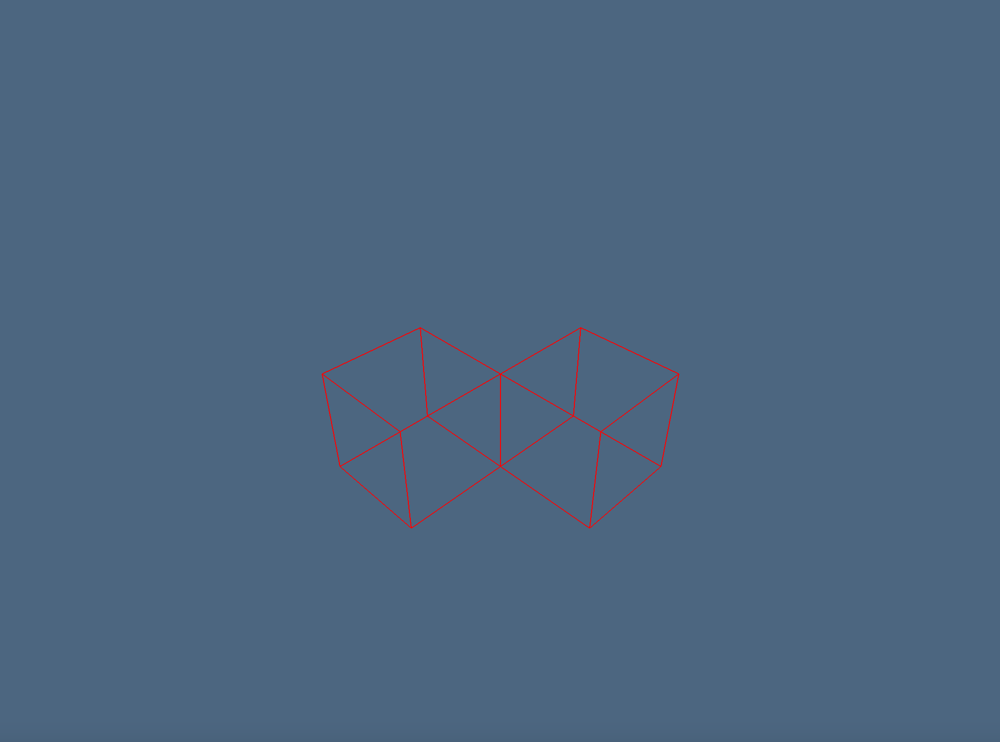

#### Confronto tra le matrici EV prima e dopo la congruenza

In [92]:
(size(EV,1), size(EV_B,1))

(24, 23)

In [93]:
size(EV) > size(EV_B)

true

#### Space arrangement e numerazione di vertici e facce della geometria

In [94]:
V, copEV, copFE, copCF = Lar.space_arrangement( W, cop_EW, cop_FE);

In [95]:
EV = Lar.cop2lar(copEV);
FE = Lar.cop2lar(copFE);
CF = Lar.cop2lar(copCF);
FV = [union([EV[e] for e in fe]...) for fe in FE];
CV = [union([FV[f] for f in cf]...) for cf in CF];
W = convert(Lar.Points, V');
WW = [[k] for k=1:size(W,2)];

In [96]:
GL.VIEW(GL.numbering(.5)((W,[WW,EV,FV,CV])));

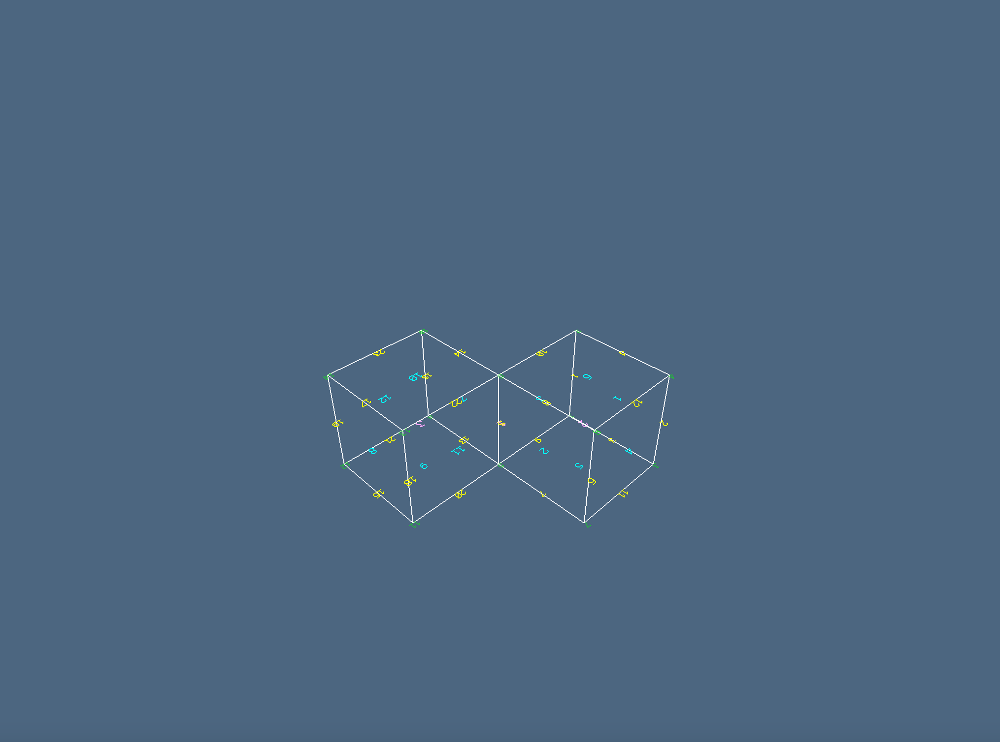

#### Rappresentazione finale dei vertici delle facce della geometria

In [98]:
V,CVs,FVs,EVs = Lar.pols2tria(W, copEV, copFE, copCF);

.EVs = [[[1, 2], [3, 4], [1, 3], [2, 4]], [[5, 6], [7, 8], [5, 7], [6, 8]], [[1, 2], [5, 6], [1, 5], [2, 6]], [[3, 4], [7, 8], [3, 7], [4, 8]], [[1, 3], [5, 7], [1, 5], [3, 7]], [[2, 4], [6, 8], [2, 6], [4, 8]], [[5, 6], [5, 9], [6, 10], [9, 10]], [[11, 12], [13, 14], [11, 13], [12, 14]], [[5, 9], [11, 12], [5, 11], [9, 12]], [[6, 10], [13, 14], [6, 13], [10, 14]], [[5, 6], [11, 13], [5, 11], [6, 13]], [[9, 10], [12, 14], [9, 12], [10, 14]]]
triangulated_faces = Any[[[3, 4, 2], [2, 1, 3]], [[7, 5, 6], [6, 8, 7]], [[1, 5, 6], [6, 2, 1]], [[4, 3, 8], [7, 8, 3]], [[1, 5, 7], [7, 3, 1]], [[4, 8, 2], [6, 2, 8]], [[9, 5, 6], [6, 10, 9]], [[14, 13, 11], [11, 12, 14]], [[9, 5, 11], [11, 12, 9]], [[14, 13, 6], [6, 10, 14]], [[6, 5, 11], [11, 13, 6]], [[14, 10, 9], [9, 12, 14]]]


In [99]:
GL.VIEW(GL.GLExplode(V,FVs,1.2,1.2,1.2,99,1));
GL.VIEW(GL.GLExplode(V,EVs,1.2,1.2,1.2,99,1));
GL.VIEW(GL.GLExplode(V,CVs[2:end],5,5,5,99,0.5));

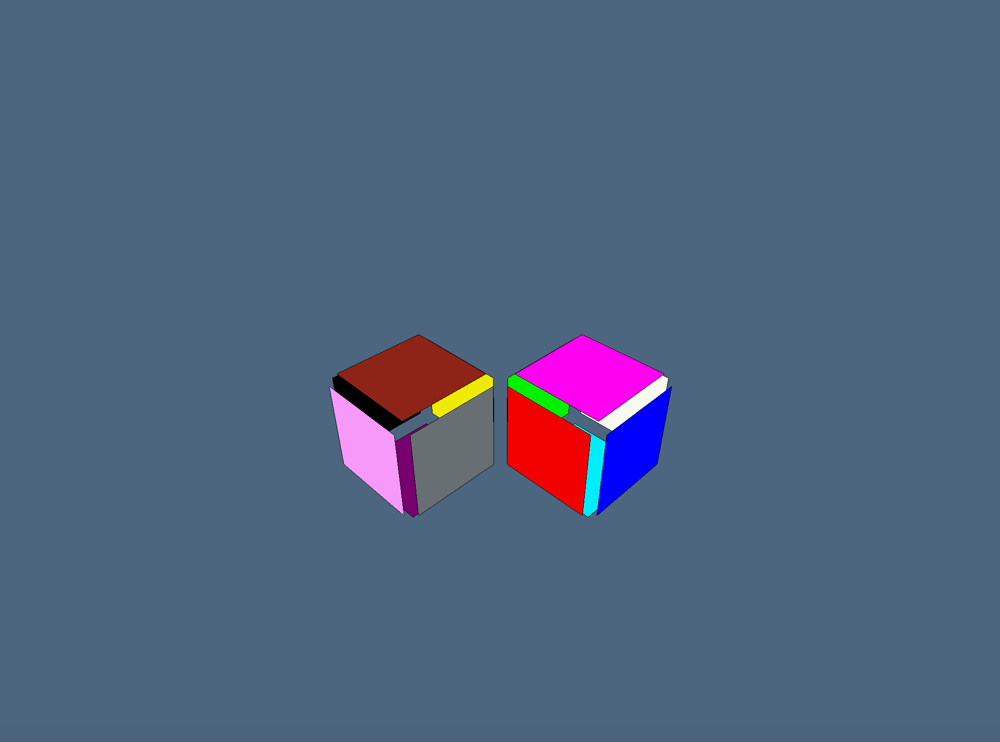

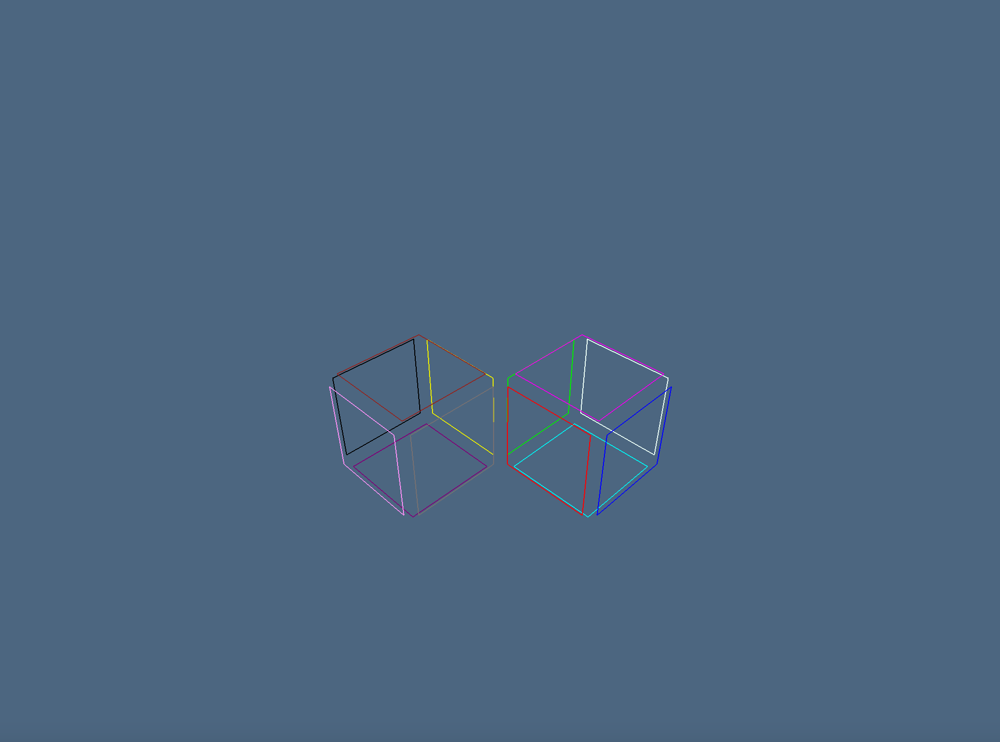

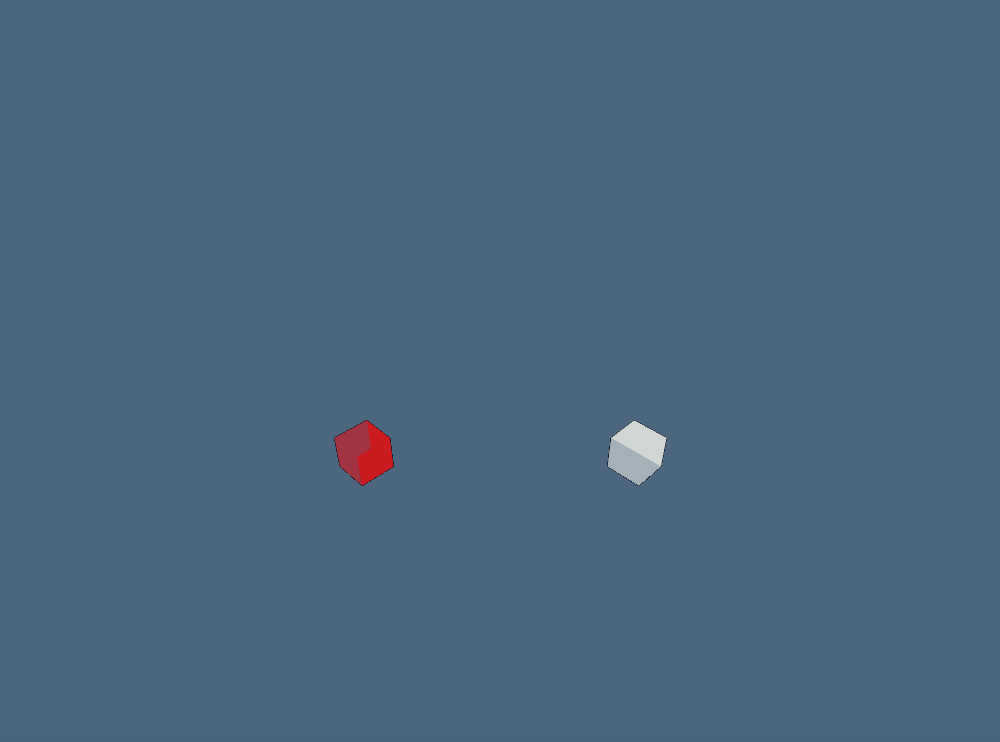

# <br><br><br><br><br><br><br><br><br><br><br><br><br><br><br>Example 4 - two near cubes 
### Cubes number: 2
Quest'ultimo esempio di piccole dimensioni viene proposto per capire i limiti di applicazione della funzione **chainCongruence()**.
* vengono creati due cubi:
    * Lo spigolo di uno dei due giace su una delle facce dell'altro
* tali cubi sono creati in modo separato, perciò essi saranno composti da vertici, facce e spigoli **distinti**;
* godendo di queste caratteristiche, alla geometria può essere applicata la funzione **chainCongruence()**, **MA essa non avrà alcun effetto**: infatti, dato che non ci sono vertici, facce o spigoli in comune tra i due cubi, non esistono duplicati di essi, quindi la funzione non rimuoverà nulla.

#### Creazione dei due cubi adiacenti

In [242]:
V,(VV,EV,FV,CV) = Lar.cuboid([1,true,1],true);
mybox = (V,CV,FV,EV);
twocubs = Lar.Struct([mybox, Lar.t(1.707,-0.2,0), Lar.r(0,0,pi/4), mybox]);
V,CV,FV,EV = Lar.struct2lar(twocubs);

#### Dimensione delle matrici EV e FV prima di ***chainCongruence()***

In [243]:
V

3×16 Matrix{Float64}:
 0.0  0.0  0.0  0.0  1.0  1.0  1.0  1.0  …  2.41411   1.707    1.707
 0.0  0.0  1.0  1.0  0.0  0.0  1.0  1.0     0.507107  1.21421  1.21421
 0.0  1.0  0.0  1.0  0.0  1.0  0.0  1.0     1.0       0.0      1.0

In [244]:
size(EV)

(24,)

In [245]:
size(FV)

(12,)

#### Rappresentazione grafica delle griglie

In [248]:
GL.VIEW([GL.GLGrid(V,EV, GL.COLORS[3], 0.5)]);

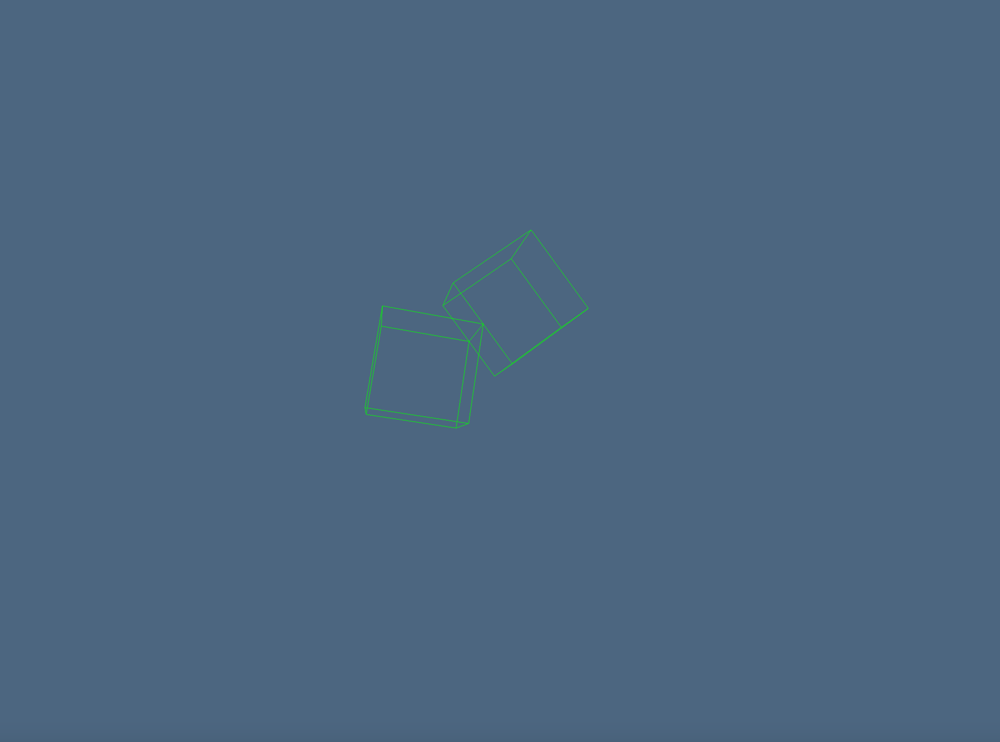

In [249]:
GL.VIEW([GL.GLGrid(V,FV, GL.COLORS[2], 0.5)]);

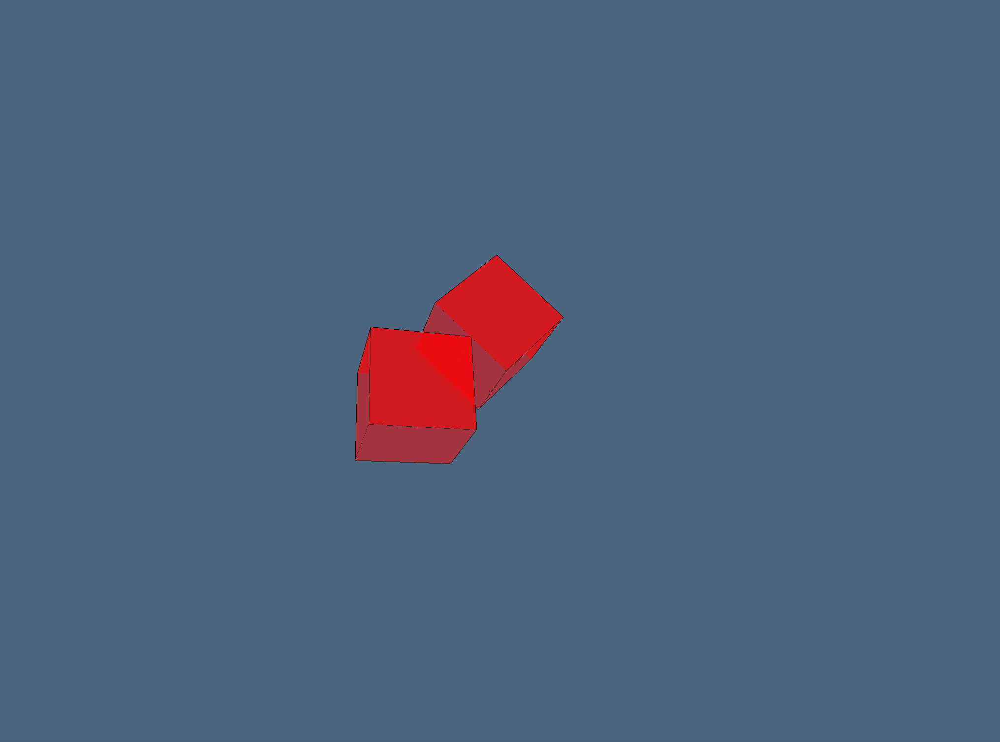

In [250]:
W = convert(Lar.Points, V');
cop_EV = Lar.coboundary_0(EV::Lar.Cells);
cop_EW = convert(Lar.ChainOp, cop_EV);
cop_FE = Lar.coboundary_1(V, FV::Lar.Cells, EV::Lar.Cells);
T = [cop_EV, cop_FE];

### Chain Congruence application
**Verrà ora dimostrato che la dimensione di EV ottenuto dopo la congruenza è uguale a quella iniziale.**
Questo è dovuto al fatto che non ci sono vertici, facce o spigoli duplicati e quindi la funzione "chainCongruence()" non ha modificato nulla.

In [251]:
V_B,EV_B,FE_B = chainCongruenceAA(W, T);

In [252]:
GL.VIEW([GL.GLGrid(V_B, EV_B, GL.COLORS[2], 1)]);

Come si può vedere, la griglia ottenuta è identica a quella di partenza, ma i vertici in EV utilizzati per la sua creazione sono in numero minore.
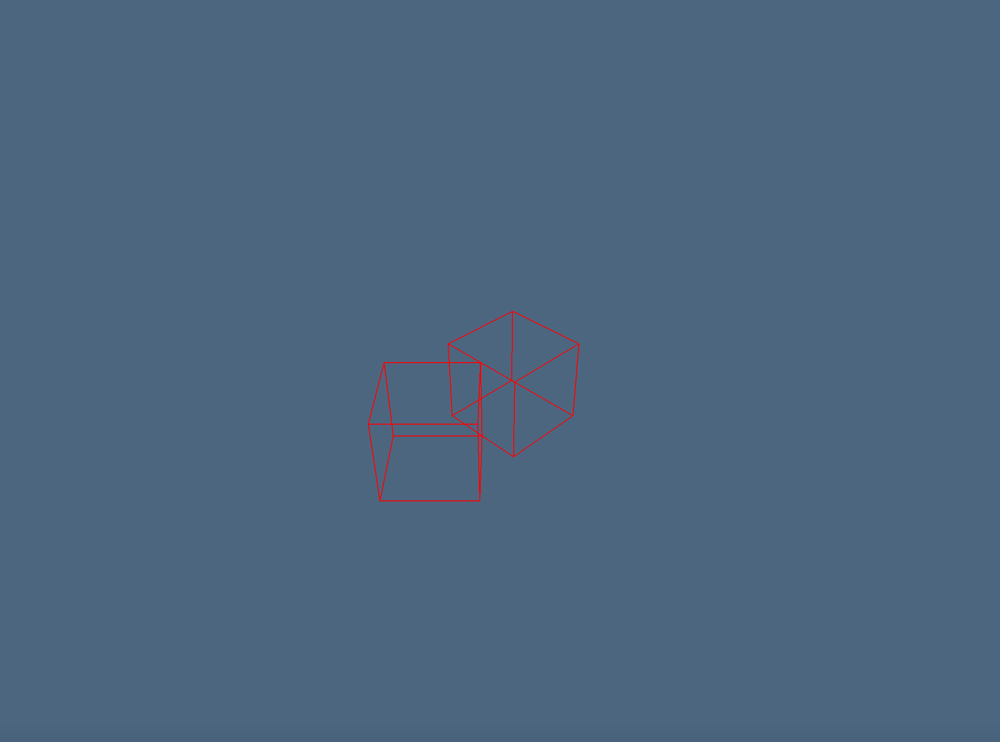

#### Confronto tra le matrici EV prima e dopo la congruenza

In [253]:
(size(EV,1), size(EV_B,1))

(24, 24)

In [254]:
size(EV) > size(EV_B)

false

#### Space arrangement e numerazione di vertici e facce della geometria

In [255]:
V, copEV, copFE, copCF = Lar.space_arrangement( W, cop_EW, cop_FE);

In [256]:
EV = Lar.cop2lar(copEV);
FE = Lar.cop2lar(copFE);
CF = Lar.cop2lar(copCF);
FV = [union([EV[e] for e in fe]...) for fe in FE];
CV = [union([FV[f] for f in cf]...) for cf in CF];
W = convert(Lar.Points, V');
WW = [[k] for k=1:size(W,2)];

In [257]:
GL.VIEW(GL.numbering(.5)((W,[WW,EV,FV,CV])));

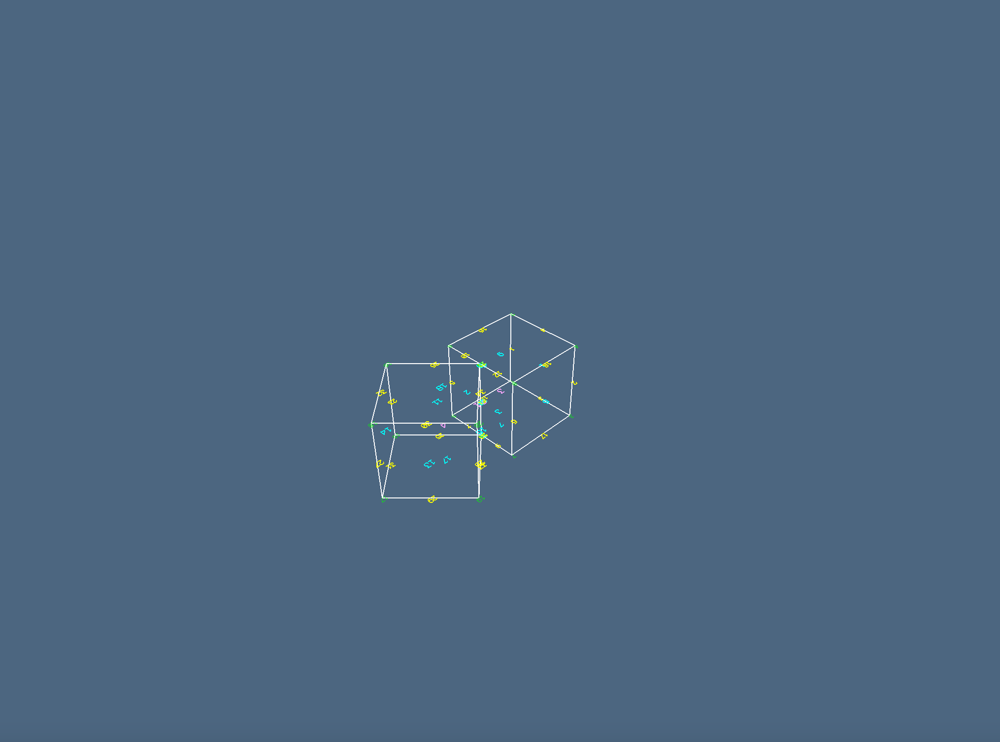

#### Rappresentazione finale dei vertici delle facce della geometria

In [258]:
V,CVs,FVs,EVs = Lar.pols2tria(W, copEV, copFE, copCF);

.EVs = [[[1, 2], [3, 4], [1, 3], [2, 4]], [[5, 6], [5, 9], [6, 11], [9, 11]], [[7, 8], [7, 10], [8, 12], [10, 12]], [[9, 10], [11, 12], [9, 11], [10, 12]], [[1, 2], [5, 6], [1, 5], [2, 6]], [[3, 4], [7, 8], [3, 7], [4, 8]], [[1, 3], [5, 9], [7, 10], [1, 5], [3, 7], [9, 13], [10, 13]], [[9, 10], [9, 13], [10, 13]], [[2, 4], [6, 11], [8, 12], [2, 6], [4, 8], [11, 14], [12, 14]], [[11, 12], [11, 14], [12, 14]], [[9, 11], [15, 16], [9, 15], [11, 16]], [[9, 11], [9, 13], [11, 14], [13, 14]], [[17, 18], [19, 20], [17, 19], [18, 20]], [[15, 16], [17, 18], [15, 17], [16, 18]], [[10, 12], [10, 13], [12, 14], [13, 14]], [[10, 12], [19, 20], [10, 19], [12, 20]], [[9, 10], [9, 15], [17, 19], [15, 17], [10, 19]], [[11, 12], [11, 16], [18, 20], [16, 18], [12, 20]]]
triangulated_faces = Any[[[3, 4, 2], [2, 1, 3]], [[9, 5, 6], [6, 11, 9]], [[8, 7, 10], [10, 12, 8]], [[11, 12, 9], [10, 9, 12]], [[1, 5, 6], [6, 2, 1]], [[4, 3, 8], [7, 8, 3]], [[1, 5, 13], [13, 5, 9], [10, 7, 13], [13, 3, 1], [3, 13, 7]]

In [259]:
GL.VIEW(GL.GLExplode(V,FVs,1.2,1.2,1.2,99,1));
GL.VIEW(GL.GLExplode(V,EVs,1.2,1.2,1.2,99,1));
GL.VIEW(GL.GLExplode(V,CVs[2:end],5,5,5,99,0.5));

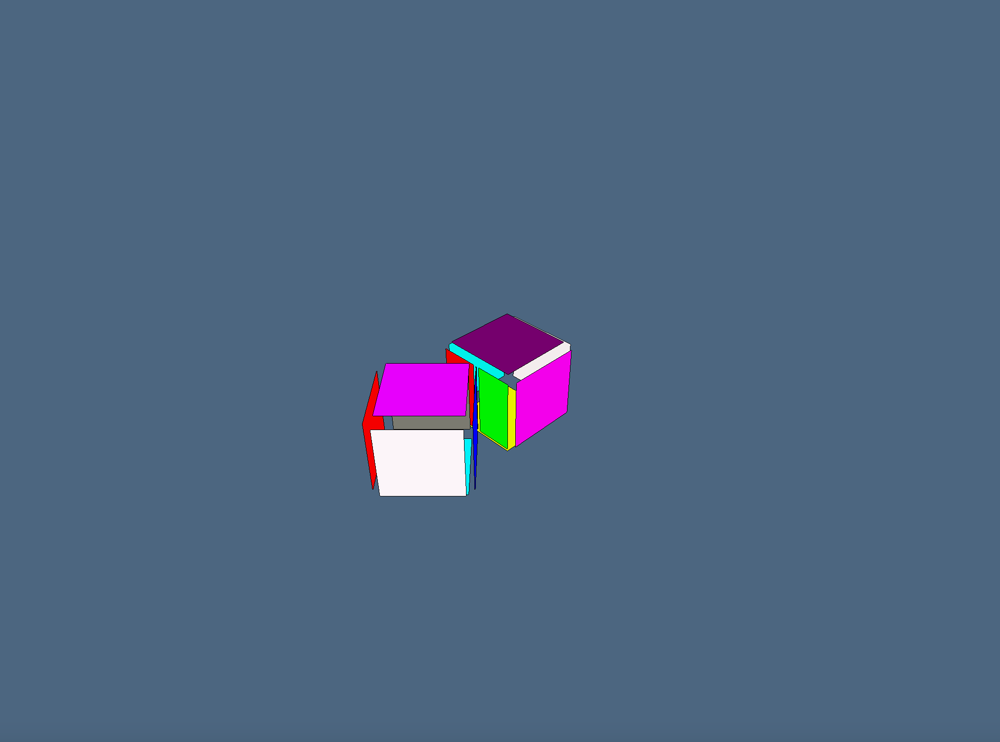

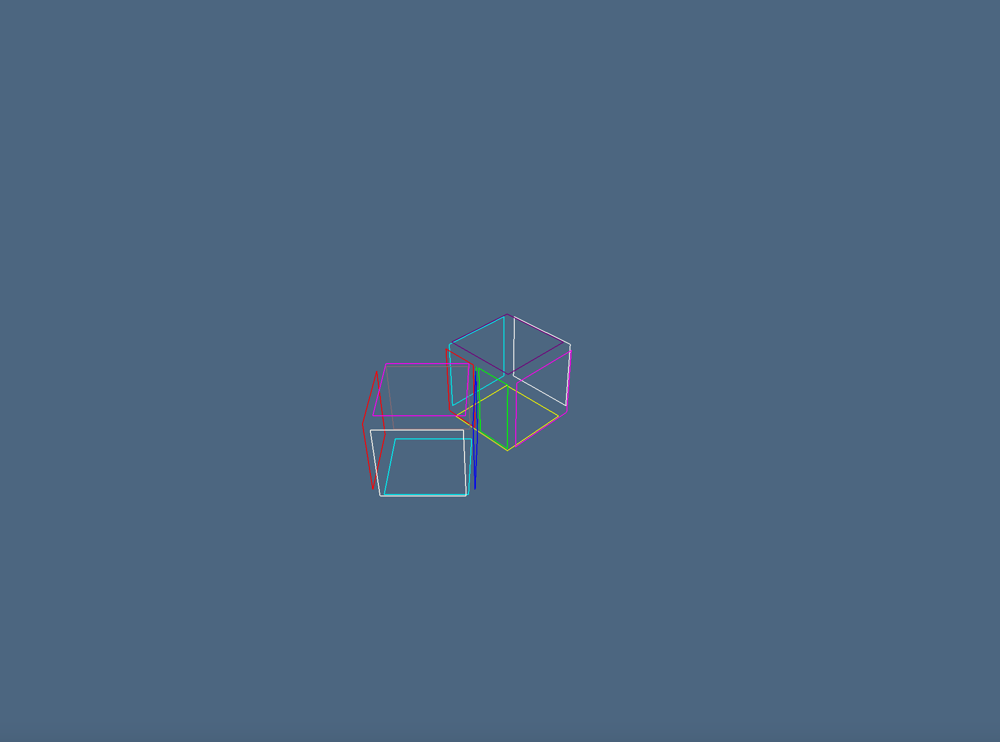

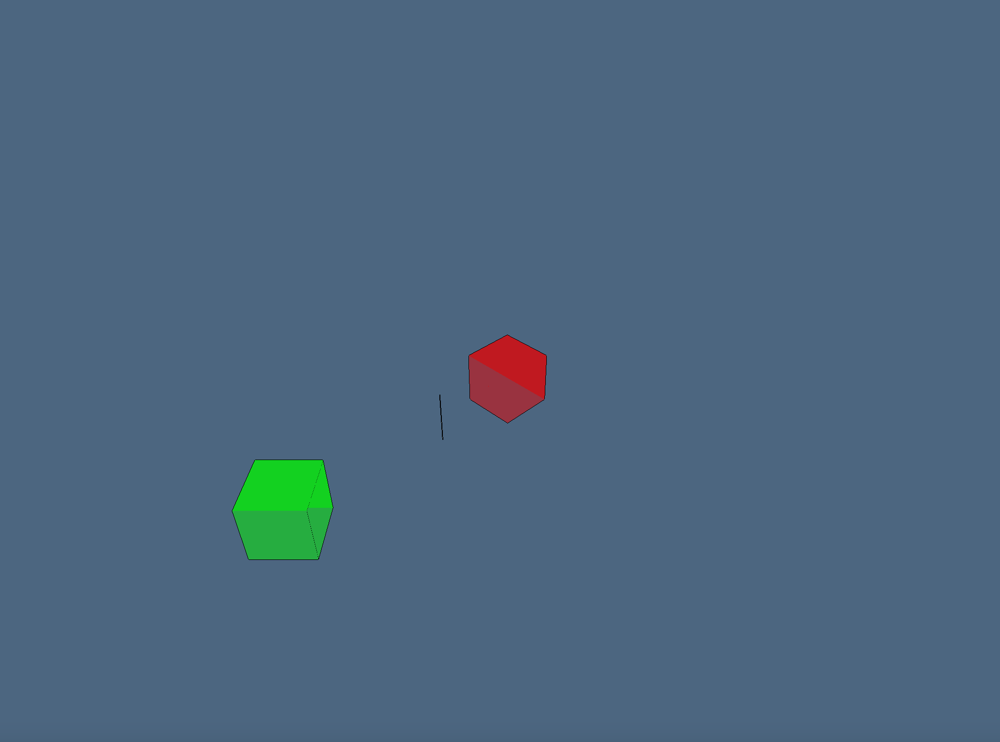

# <br><br><br><br><br><br><br><br><br><br><br><br><br><br><br>Example 5 - Grid inside another grid
### Small Grid: 3x3x3<br>Big grid: 5x5x5<br>Cells number: 27 + 125 = 134
Riprendendo l'esempio precedente sulle griglie, ne verranno ora mostrate due di diverse dimensioni, con la più grande sovrapposta alla prima (le due griglie sono perfettamente congruenti sulle celle della più piccola tra le due).
L'obiettivo di questo esempio è mostrare come, applicando ***chainCongruence()***, sia possibile ridurre notevolmente il numero di vertici, facce e spigoli inizialmente creati, eliminando i doppioni; questa azione è necessaria perché le celle della griglia più piccola sono duplicate (la griglia più grande contiene celle nelle stesse identiche posizioni della più piccola, quindi vertici, spigoli e facce sono duplicate)

#### Creazione delle griglie

In [52]:
#First grid, the smallest one
V1,(VV1,EV1,FV1,CV1) = Lar.cuboidGrid([3,3,3],true);
mybox1 = (V1,CV1,FV1,EV1);

#Second grid, the biggest one
V2,(VV2,EV2,FV2,CV2) = Lar.cuboidGrid([5,5,5],true);
mybox2 = (V2,CV2,FV2,EV2);

twocubs = Lar.Struct([mybox1, L.t(.0000001,.0,.0), mybox2]);
V_A,CV_A,FV_A,EV_A = Lar.struct2lar(twocubs);

#### Dimensione delle matrici EV e FV prima di ***chainCongruence()***

In [31]:
size(EV_A)

(684,)

In [32]:
size(FV_A)

(558,)

#### Rappresentazione grafica delle griglie

In [17]:
GL.VIEW([GL.GLGrid(V1,EV1, GL.COLORS[2], 1), GL.GLGrid(V2,EV2, GL.COLORS[4], 0.2)]);

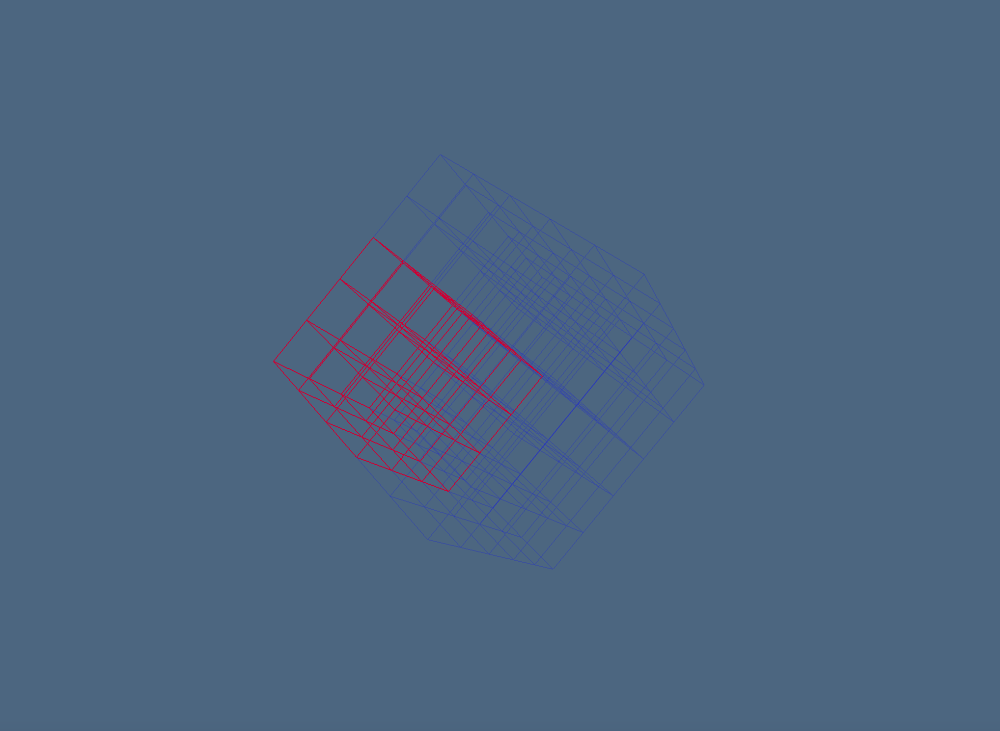

In [18]:
GL.VIEW([GL.GLGrid(V1,FV1, GL.COLORS[2], 1), GL.GLGrid(V2,FV2, GL.COLORS[4], 0.2)]);

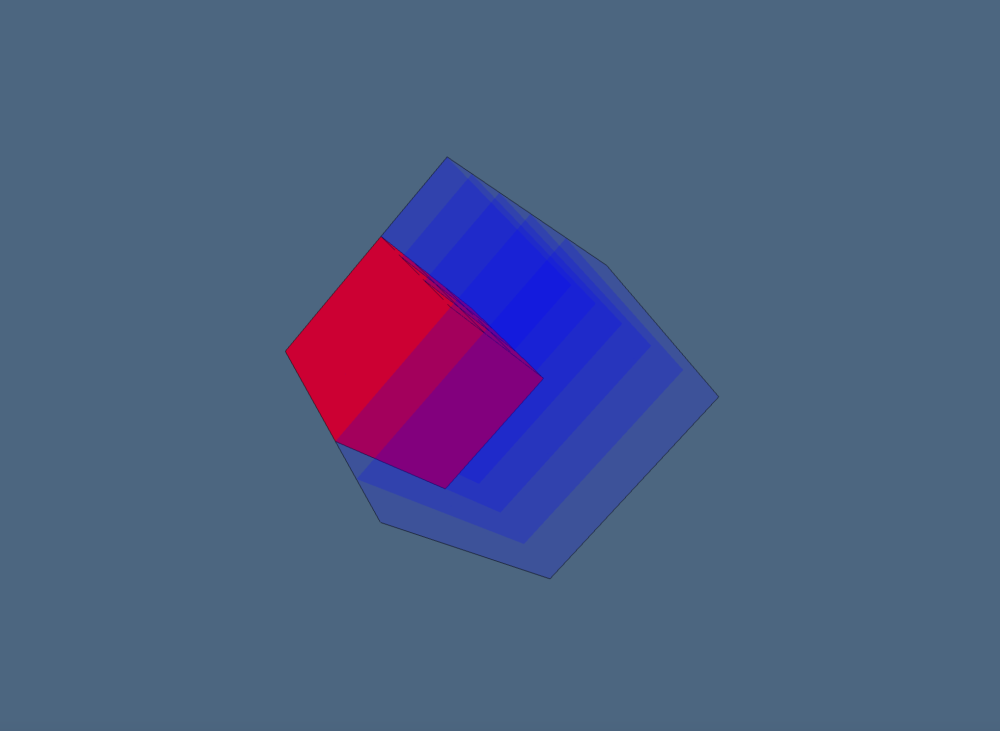

#### Creazione delle matrici di cobordo

In [83]:
W = convert(Lar.Points, V_A');
cop_EV = Lar.coboundary_0(EV_A::Lar.Cells);
cop_EW = convert(Lar.ChainOp, cop_EV);
cop_FE = Lar.coboundary_1(V_A, FV_A::Lar.Cells, EV_A::Lar.Cells)
T = [cop_EV, cop_FE];

### Chain Congruence application
**Verrà ora dimostrato che la dimensione di EV ottenuto dopo la congruenza è minore rispetto a quello iniziale.**
Questo è dovuto al fatto che molti spigoli risultano duplicati e la funziona "chainCongruence()" li ha eliminati (in particolare: **EV_A - EV_B = 684 - 540 = 144** vertici doppioni eliminati).

In [84]:
V_B,EV_B,FE_B = chainCongruenceAA(W, T);

In [ ]:
GL.VIEW([GL.GLGrid(V_B, EV_B, GL.COLORS[2], 1)]);

Come si può vedere, la griglia ottenuta è identica a quella di partenza, ma i vertici utilizzati per la sua creazione sono in numero minore.
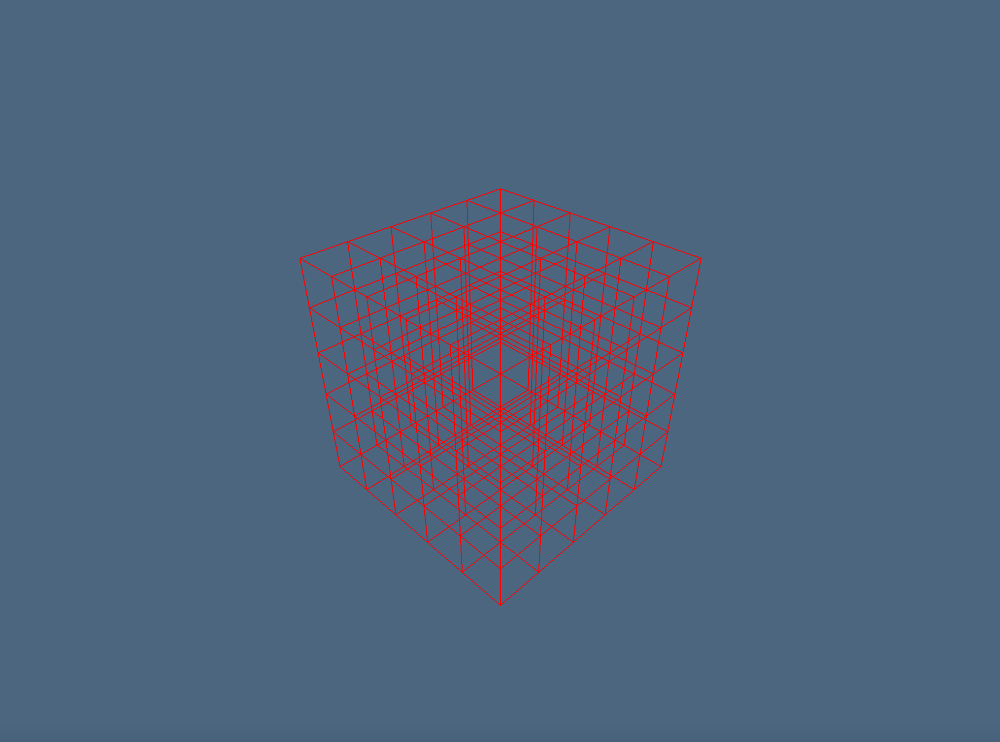

#### Confronto tra le matrici EV prima e dopo la congruenza

In [85]:
(size(EV_A,1), size(EV_B,1))

(684, 540)

In [86]:
size(EV_A) > size(EV_B)

true

#### Space arrangement e numerazione di vertici e facce della geometria

In [87]:
V, copEV, copFE, copCF = Lar.space_arrangement( W, cop_EW, cop_FE);

In [88]:
EV = Lar.cop2lar(copEV);
FE = Lar.cop2lar(copFE);
CF = Lar.cop2lar(copCF);
FV = [union([EV[e] for e in fe]...) for fe in FE];
CV = [union([FV[f] for f in cf]...) for cf in CF];
W = convert(Lar.Points, V');
WW = [[k] for k=1:size(W,2)];

In [89]:
GL.VIEW(GL.numbering(.5)((W,[WW,EV,FV,CV])));

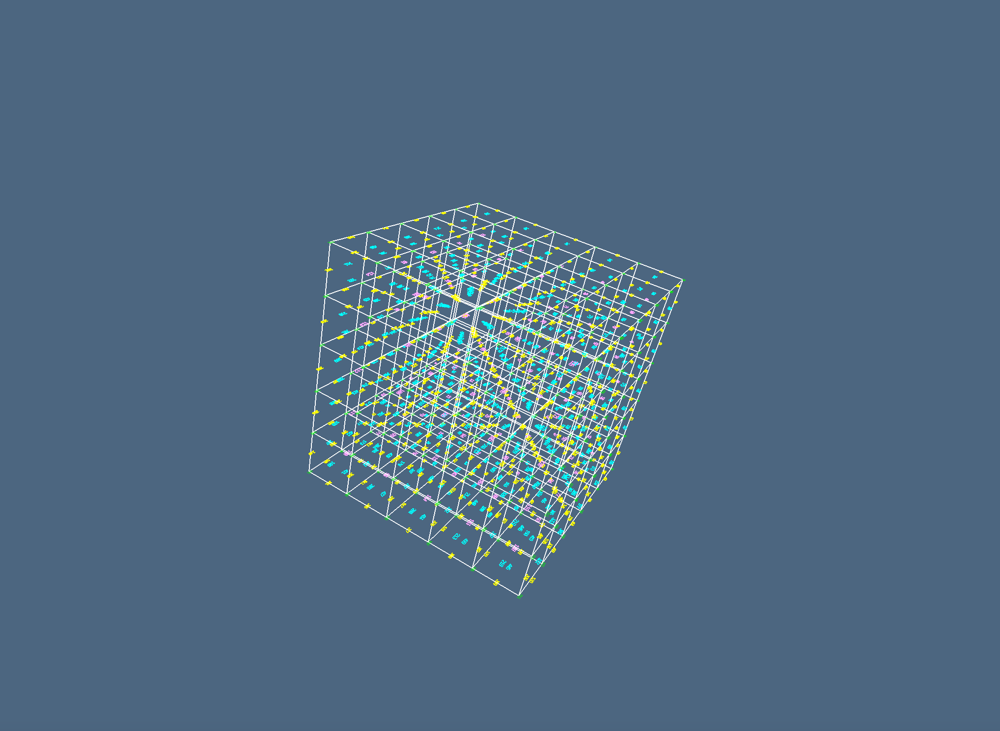

#### Rappresentazione finale dei vertici delle facce della geometria

In [91]:
V,CVs,FVs,EVs = Lar.pols2tria(W, copEV, copFE, copCF);

.............................................EVs = [[[1, 2], [3, 4], [1, 3], [2, 4]], [[2, 4], [2, 5], [4, 6], [5, 6]], [[5, 6], [5, 7], [6, 8], [7, 8]], [[3, 4], [9, 10], [3, 9], [4, 10]], [[4, 6], [4, 10], [10, 11], [6, 11]], [[6, 8], [6, 11], [11, 12], [8, 12]], [[9, 10], [13, 14], [9, 13], [10, 14]], [[10, 11], [10, 14], [14, 15], [11, 15]], [[11, 12], [11, 15], [15, 16], [12, 16]], [[17, 18], [19, 20], [17, 19], [18, 20]], [[18, 20], [18, 21], [20, 22], [21, 22]], [[21, 22], [21, 23], [22, 24], [23, 24]], [[19, 20], [25, 26], [19, 25], [20, 26]], [[20, 22], [20, 26], [26, 27], [22, 27]], [[22, 24], [22, 27], [27, 28], [24, 28]], [[25, 26], [29, 30], [25, 29], [26, 30]], [[26, 27], [26, 30], [30, 31], [27, 31]], [[27, 28], [27, 31], [31, 32], [28, 32]], [[33, 34], [35, 36], [33, 35], [34, 36]], [[34, 36], [34, 37], [36, 38], [37, 38]], [[37, 38], [37, 39], [38, 40], [39, 40]], [[35, 36], [41, 42], [35, 41], [36, 42]], [[36, 38], [36, 42], [42, 43], [38, 43]], [[38, 40], [38, 43], [

triangulated_faces = Any[[[3, 4, 2], [2, 1, 3]], [[5, 2, 6], [4, 6, 2]], [[7, 5, 6], [6, 8, 7]], [[3, 4, 10], [10, 9, 3]], [[10, 4, 6], [6, 11, 10]], [[8, 6, 11], [11, 12, 8]], [[13, 14, 9], [10, 9, 14]], [[14, 15, 11], [11, 10, 14]], [[11, 15, 16], [16, 12, 11]], [[19, 20, 18], [18, 17, 19]], [[21, 22, 20], [20, 18, 21]], [[24, 22, 21], [21, 23, 24]], [[20, 19, 26], [25, 26, 19]], [[27, 22, 20], [20, 26, 27]], [[24, 22, 27], [27, 28, 24]], [[30, 29, 25], [25, 26, 30]], [[31, 27, 26], [26, 30, 31]], [[32, 28, 31], [27, 31, 28]], [[34, 36, 33], [35, 33, 36]], [[37, 34, 36], [36, 38, 37]], [[39, 40, 37], [38, 37, 40]], [[36, 35, 41], [41, 42, 36]], [[43, 42, 38], [36, 38, 42]], [[38, 43, 44], [44, 40, 38]], [[42, 41, 45], [45, 46, 42]], [[46, 47, 43], [43, 42, 46]], [[48, 47, 43], [43, 44, 48]], [[52, 51, 49], [49, 50, 52]], [[50, 53, 52], [54, 52, 53]], [[54, 56, 55], [55, 53, 54]], [[51, 57, 52], [58, 52, 57]], [[58, 59, 54], [54, 52, 58]], [[59, 60, 54], [56, 54, 60]], [[61, 57, 62], 

In [92]:
GL.VIEW(GL.GLExplode(V,FVs,1.2,1.2,1.2,99,1));
GL.VIEW(GL.GLExplode(V,EVs,1.2,1.2,1.2,99,1));
GL.VIEW(GL.GLExplode(V,CVs[2:end],5,5,5,99,0.5));

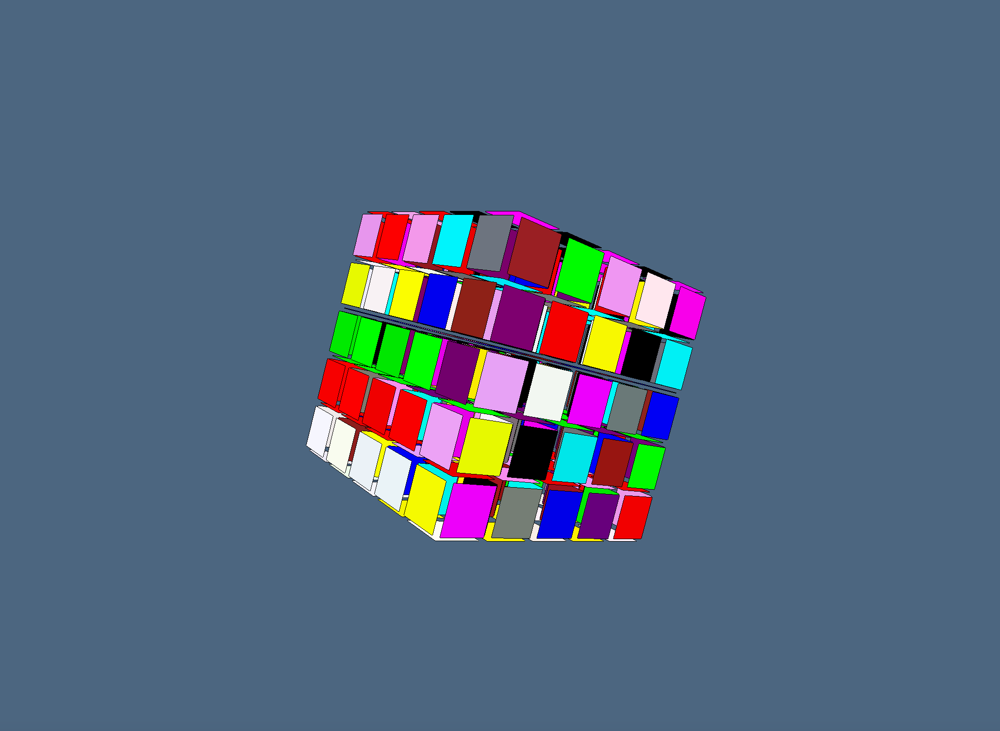

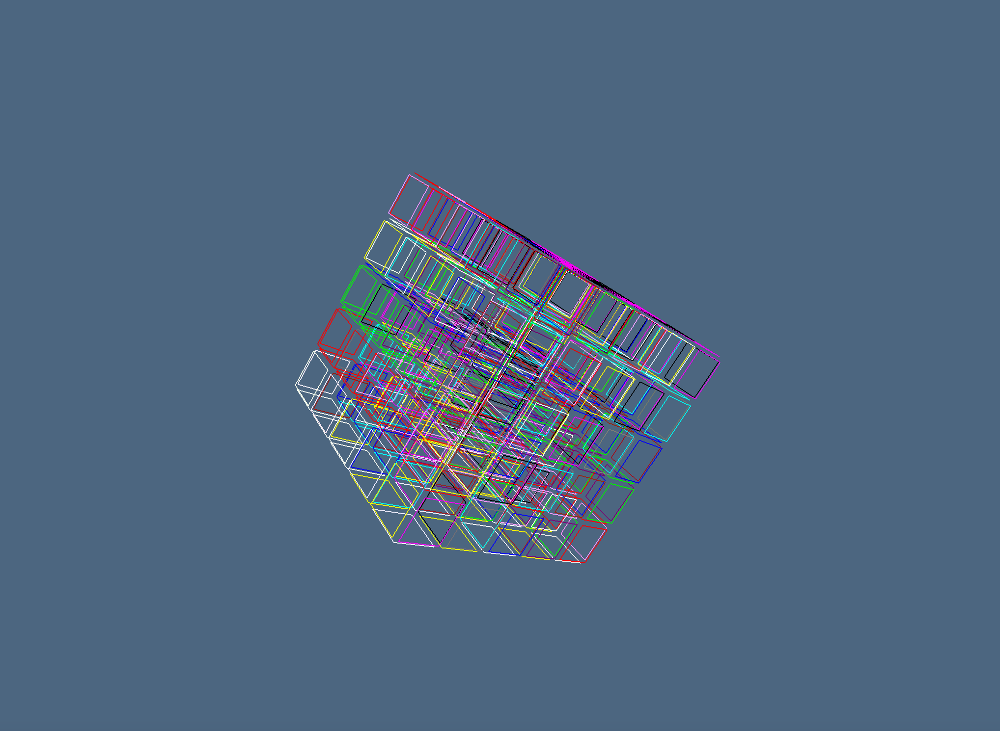

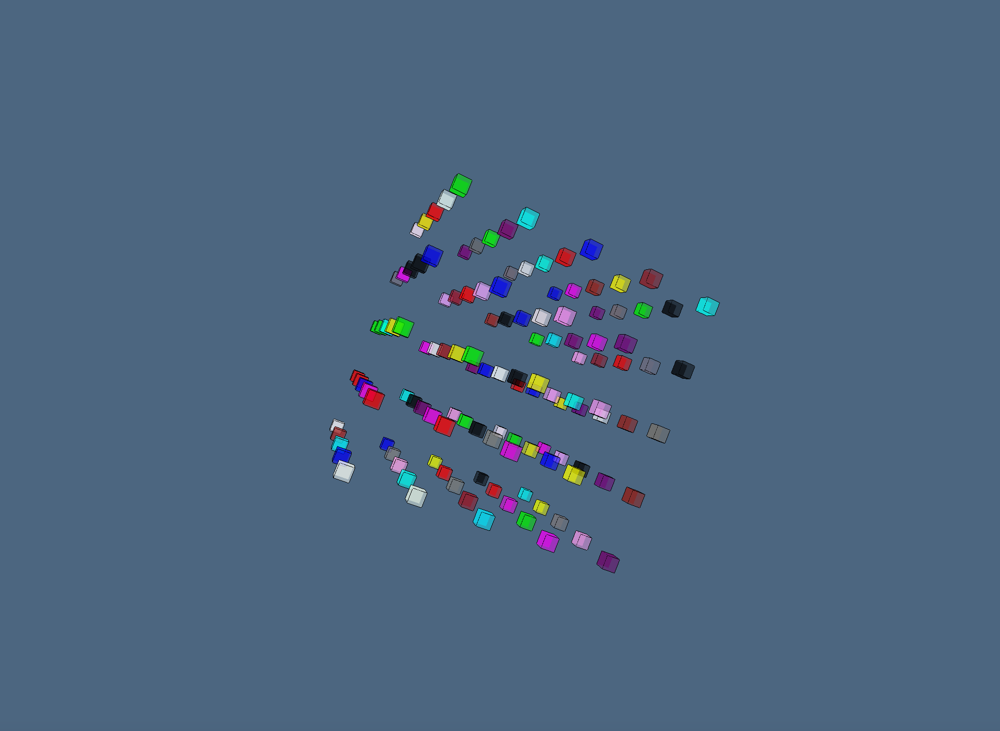

# <br><br><br><br><br><br><br><br><br><br><br><br><br><br><br>Example 6 - Grid inside another grid (BIG)
### Small Grid: 10x10x10<br>Big grid: 15x15x15<br>Cells number: 1000 + 3375  = 4375
Viene replicato l'esempio precedente, ma con dimensioni delle griglie decisamente più grandi (4375 celle contro le 134 dell'esempio precedente). L'obiettivo è quello di spingere il calcolatore ad effettuare calcoli di grande portata, mettendolo in difficoltà. Anche quì, verrà dimostrata la correttezza dell'output, sia della funzione **chainCongruence()**, sia delle funzioni per la presentazione grafica di ViewerGL.

#### Creazione delle griglie

In [93]:
#First grid, the smallest one
V1,(VV1,EV1,FV1,CV1) = Lar.cuboidGrid([10,10,10],true);
mybox1 = (V1,CV1,FV1,EV1);

#Second grid, the biggest one
V2,(VV2,EV2,FV2,CV2) = Lar.cuboidGrid([15,15,15],true);
mybox2 = (V2,CV2,FV2,EV2);

twocubs = Lar.Struct([mybox1, L.t(.0000001,.0,.0), mybox2]);
V_A,CV_A,FV_A,EV_A = Lar.struct2lar(twocubs);

#### Dimensione delle matrici EV e FV prima di ***chainCongruence()***

In [94]:
size(EV_A)

(15150,)

In [95]:
size(FV_A)

(14100,)

#### Rappresentazione grafica delle griglie

In [97]:
GL.VIEW([GL.GLGrid(V1,EV1, GL.COLORS[2], 1), GL.GLGrid(V2,EV2, GL.COLORS[4], 0.2)]);

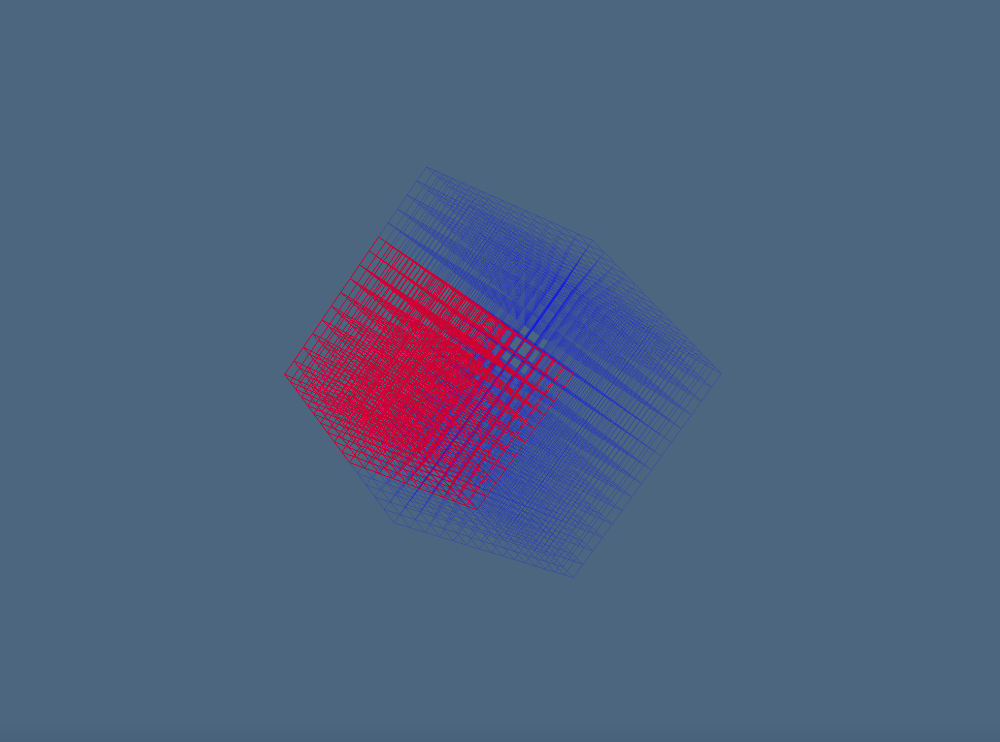

In [98]:
GL.VIEW([GL.GLGrid(V1,FV1, GL.COLORS[2], 1), GL.GLGrid(V2,FV2, GL.COLORS[4], 0.2)]);

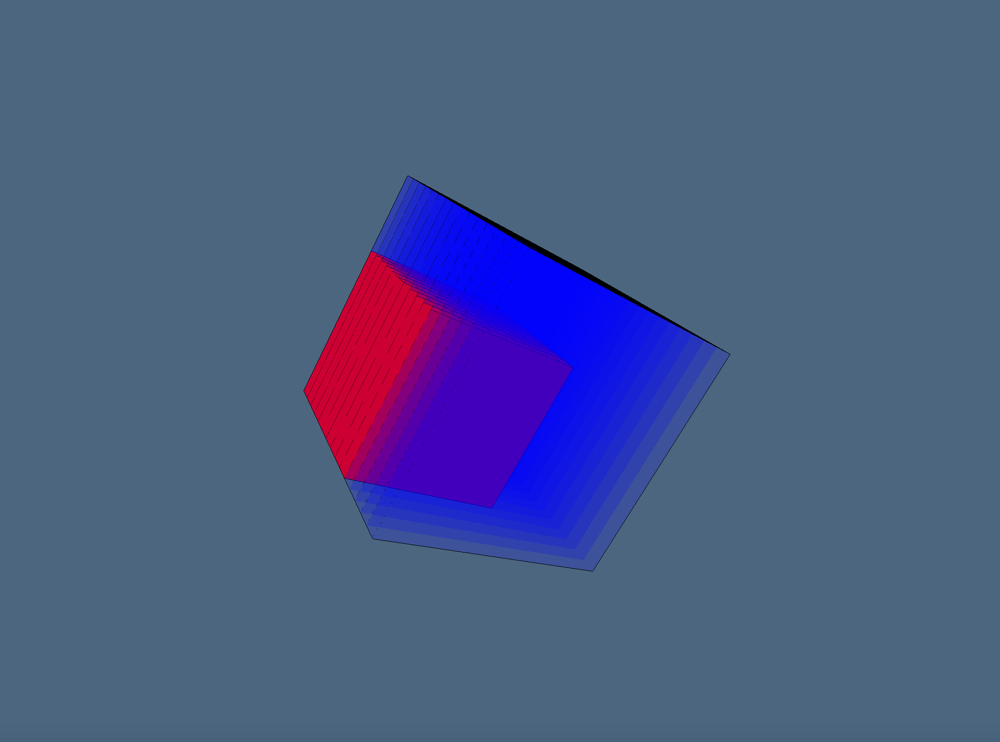

#### Creazione delle matrici di cobordo

In [99]:
W = convert(Lar.Points, V_A');
cop_EV = Lar.coboundary_0(EV_A::Lar.Cells);
cop_EW = convert(Lar.ChainOp, cop_EV);
cop_FE = Lar.coboundary_1(V_A, FV_A::Lar.Cells, EV_A::Lar.Cells)
T = [cop_EV, cop_FE];

### Chain Congruence application
**Verrà ora dimostrato che la dimensione di EV ottenuto dopo la congruenza è minore rispetto a quello iniziale.**
Questo è dovuto al fatto che molti spigoli risultano duplicati e la funziona "chainCongruence()" li ha eliminati (in particolare: **EV_A - EV_B = 15150 - 11520 = 3630** vertici doppioni eliminati).

In [100]:
V_B,EV_B,FE_B = chainCongruenceAA(W, T);

In [102]:
GL.VIEW([GL.GLGrid(V_B, EV_B, GL.COLORS[2], 1)]);

Come si può vedere, la griglia ottenuta è identica a quella di partenza, ma i vertici utilizzati per la sua creazione sono in numero minore.
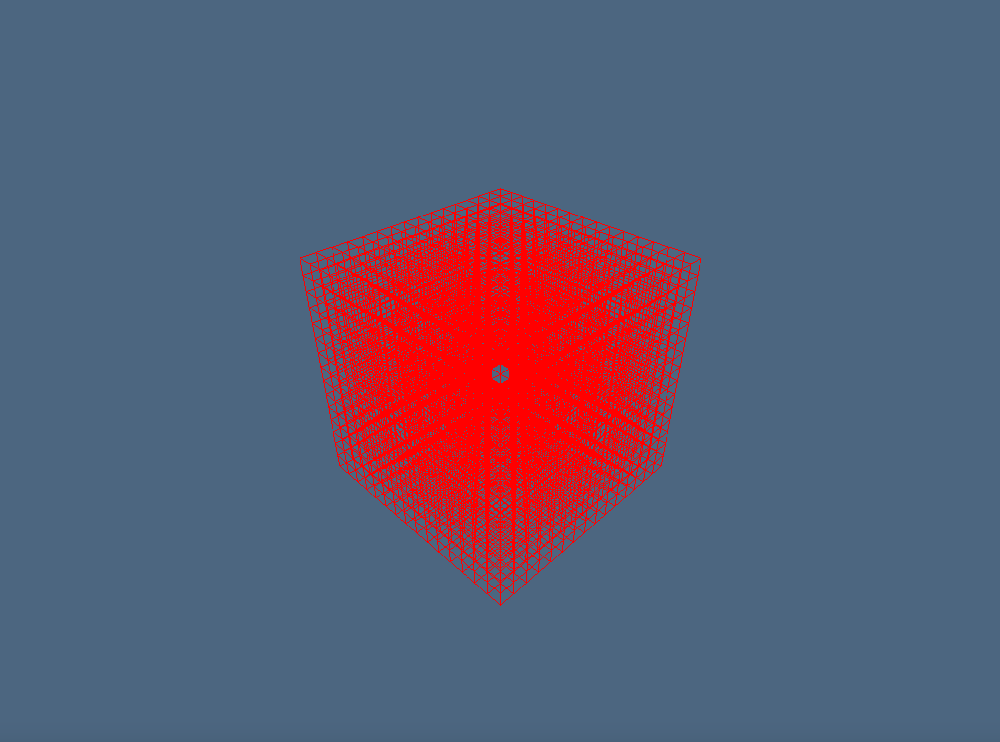

#### Confronto tra le matrici EV prima e dopo la congruenza

In [103]:
(size(EV_A,1), size(EV_B,1))

(15150, 11520)

In [104]:
size(EV_A) > size(EV_B)

true

#### Space arrangement e numerazione di vertici e facce della geometria

In [105]:
V, copEV, copFE, copCF = Lar.space_arrangement( W, cop_EW, cop_FE);

In [106]:
EV = Lar.cop2lar(copEV);
FE = Lar.cop2lar(copFE);
CF = Lar.cop2lar(copCF);
FV = [union([EV[e] for e in fe]...) for fe in FE];
CV = [union([FV[f] for f in cf]...) for cf in CF];
W = convert(Lar.Points, V');
WW = [[k] for k=1:size(W,2)];

In [107]:
GL.VIEW(GL.numbering(.5)((W,[WW,EV,FV,CV])));

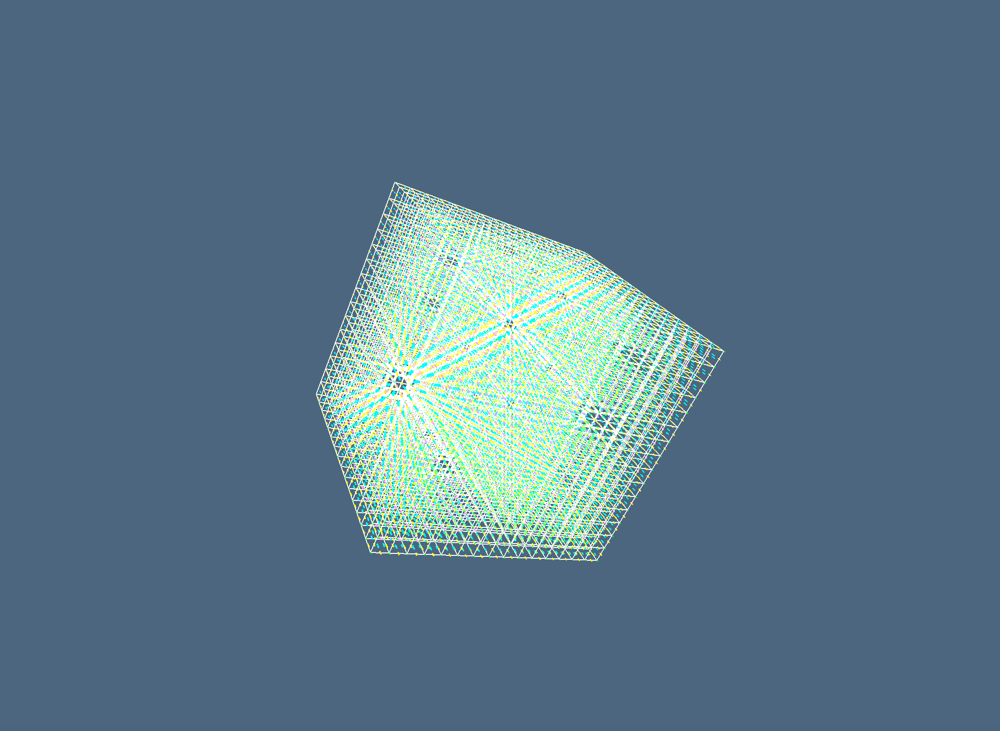

#### Rappresentazione finale dei vertici delle facce della geometria

In [108]:
V,CVs,FVs,EVs = Lar.pols2tria(W, copEV, copFE, copCF);

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

, 329]], [[208, 209], [329, 330], [208, 329], [209, 330]], [[210, 211], [331, 332], [210, 331], [211, 332]], [[211, 212], [332, 333], [211, 332], [212, 333]], [[212, 213], [333, 334], [212, 333], [213, 334]], [[213, 214], [334, 335], [213, 334], [214, 335]], [[214, 215], [335, 336], [214, 335], [215, 336]], [[215, 216], [336, 337], [215, 336], [216, 337]], [[216, 217], [337, 338], [216, 337], [217, 338]], [[217, 218], [338, 339], [217, 338], [218, 339]], [[218, 219], [339, 340], [218, 339], [219, 340]], [[219, 220], [340, 341], [219, 340], [220, 341]], [[221, 222], [342, 343], [221, 342], [222, 343]], [[222, 223], [343, 344], [222, 343], [223, 344]], [[223, 224], [344, 345], [223, 344], [224, 345]], [[224, 225], [345, 346], [224, 345], [225, 346]], [[225, 226], [346, 347], [225, 346], [226, 347]], [[226, 227], [347, 348], [226, 347], [227, 348]], [[227, 228], [348, 349], [227, 348], [228, 349]], [[228, 229], [349, 350], [228, 349], [229, 350]], [[229, 230], [350, 351], [229, 350], [230

, 413], [523, 534], [402, 523], [413, 534]], [[403, 414], [524, 535], [403, 524], [414, 535]], [[404, 415], [525, 536], [404, 525], [415, 536]], [[405, 416], [526, 537], [405, 526], [416, 537]], [[406, 417], [527, 538], [406, 527], [417, 538]], [[407, 418], [528, 539], [407, 528], [418, 539]], [[408, 419], [529, 540], [408, 529], [419, 540]], [[409, 420], [530, 541], [409, 530], [420, 541]], [[410, 421], [531, 542], [410, 531], [421, 542]], [[411, 422], [532, 543], [411, 532], [422, 543]], [[412, 423], [533, 544], [412, 533], [423, 544]], [[413, 424], [534, 545], [413, 534], [424, 545]], [[414, 425], [535, 546], [414, 535], [425, 546]], [[415, 426], [536, 547], [415, 536], [426, 547]], [[416, 427], [537, 548], [416, 537], [427, 548]], [[417, 428], [538, 549], [417, 538], [428, 549]], [[418, 429], [539, 550], [418, 539], [429, 550]], [[419, 430], [540, 551], [419, 540], [430, 551]], [[420, 431], [541, 552], [420, 541], [431, 552]], [[421, 432], [542, 553], [421, 542], [432, 553]], [[422

5, 1841]], [[1825, 1826], [1825, 1841], [1841, 1842], [1826, 1842]], [[1826, 1827], [1826, 1842], [1842, 1843], [1827, 1843]], [[1827, 1828], [1827, 1843], [1843, 1844], [1828, 1844]], [[1828, 1829], [1828, 1844], [1844, 1845], [1829, 1845]], [[1829, 1830], [1829, 1845], [1845, 1846], [1830, 1846]], [[1830, 1831], [1830, 1846], [1846, 1847], [1831, 1847]], [[1831, 1832], [1831, 1847], [1847, 1848], [1832, 1848]], [[1832, 1833], [1832, 1848], [1848, 1849], [1833, 1849]], [[1833, 1834], [1833, 1849], [1849, 1850], [1834, 1850]], [[1834, 1835], [1834, 1850], [1850, 1851], [1835, 1851]], [[1835, 1836], [1835, 1851], [1851, 1852], [1836, 1852]], [[1836, 1837], [1836, 1852], [1852, 1853], [1837, 1853]], [[1837, 1838], [1837, 1853], [1853, 1854], [1838, 1854]], [[1838, 1839], [1838, 1854], [1854, 1855], [1839, 1855]], [[1840, 1841], [1856, 1857], [1840, 1856], [1841, 1857]], [[1841, 1842], [1841, 1857], [1857, 1858], [1842, 1858]], [[1842, 1843], [1842, 1858], [1858, 1859], [1843, 1859]], [[1

[3086, 3088], [3087, 3088]], [[3087, 3088], [3087, 3089], [3088, 3090], [3089, 3090]], [[3089, 3090], [3089, 3091], [3090, 3092], [3091, 3092]], [[3091, 3092], [3091, 3093], [3092, 3094], [3093, 3094]], [[3093, 3094], [3093, 3095], [3094, 3096], [3095, 3096]], [[3095, 3096], [3095, 3097], [3096, 3098], [3097, 3098]], [[3097, 3098], [3097, 3099], [3098, 3100], [3099, 3100]], [[3099, 3100], [3099, 3101], [3100, 3102], [3101, 3102]], [[3101, 3102], [3101, 3103], [3102, 3104], [3103, 3104]], [[3075, 3076], [3105, 3106], [3075, 3105], [3076, 3106]], [[3076, 3078], [3076, 3106], [3106, 3107], [3078, 3107]], [[3078, 3080], [3078, 3107], [3107, 3108], [3080, 3108]], [[3080, 3082], [3080, 3108], [3108, 3109], [3082, 3109]], [[3082, 3084], [3082, 3109], [3109, 3110], [3084, 3110]], [[3084, 3086], [3084, 3110], [3110, 3111], [3086, 3111]], [[3086, 3088], [3086, 3111], [3111, 3112], [3088, 3112]], [[3088, 3090], [3088, 3112], [3112, 3113], [3090, 3113]], [[3090, 3092], [3090, 3113], [3113, 3114], 

[1713, 1714], [1578, 1713], [1579, 1714]], [[1579, 1580], [1714, 1715], [1579, 1714], [1580, 1715]], [[1580, 1581], [1715, 1716], [1580, 1715], [1581, 1716]], [[1581, 1582], [1716, 1717], [1581, 1716], [1582, 1717]], [[1582, 1583], [1717, 1718], [1582, 1717], [1583, 1718]], [[1583, 1584], [1718, 1719], [1583, 1718], [1584, 1719]], [[1584, 1585], [1719, 1720], [1584, 1719], [1585, 1720]], [[1586, 1587], [1721, 1722], [1586, 1721], [1587, 1722]], [[1587, 1588], [1722, 1723], [1587, 1722], [1588, 1723]], [[1588, 1589], [1723, 1724], [1588, 1723], [1589, 1724]], [[1589, 1590], [1724, 1725], [1589, 1724], [1590, 1725]], [[1590, 1591], [1725, 1726], [1590, 1725], [1591, 1726]], [[1591, 1592], [1726, 1727], [1591, 1726], [1592, 1727]], [[1592, 1593], [1727, 1728], [1592, 1727], [1593, 1728]], [[1593, 1594], [1728, 1729], [1593, 1728], [1594, 1729]], [[1594, 1595], [1729, 1730], [1594, 1729], [1595, 1730]], [[1595, 1596], [1730, 1731], [1595, 1730], [1596, 1731]], [[1596, 1597], [1731, 1732], 

[2703, 2893], [2704, 2894]], [[2704, 2705], [2894, 2895], [2704, 2894], [2705, 2895]], [[2705, 2706], [2895, 2896], [2705, 2895], [2706, 2896]], [[1266, 1267], [2897, 2898], [1266, 2897], [1267, 2898]], [[1267, 1268], [2898, 2899], [1267, 2898], [1268, 2899]], [[1268, 1269], [2899, 2900], [1268, 2899], [1269, 2900]], [[1269, 1270], [2900, 2901], [1269, 2900], [1270, 2901]], [[1270, 1271], [2901, 2902], [1270, 2901], [1271, 2902]], [[1271, 1272], [2902, 2903], [1271, 2902], [1272, 2903]], [[1272, 1273], [2903, 2904], [1272, 2903], [1273, 2904]], [[1273, 1274], [2904, 2905], [1273, 2904], [1274, 2905]], [[1274, 1275], [2905, 2906], [1274, 2905], [1275, 2906]], [[1275, 1276], [2906, 2907], [1275, 2906], [1276, 2907]], [[1276, 2707], [2907, 2908], [1276, 2907], [2707, 2908]], [[2707, 2708], [2908, 2909], [2707, 2908], [2708, 2909]], [[2708, 2709], [2909, 2910], [2708, 2909], [2709, 2910]], [[2709, 2710], [2910, 2911], [2709, 2910], [2710, 2911]], [[2710, 2711], [2911, 2912], [2710, 2911], 

Excessive output truncated after 525374 bytes.

In [109]:
GL.VIEW(GL.GLExplode(V,FVs,1.2,1.2,1.2,99,1));
GL.VIEW(GL.GLExplode(V,EVs,1.2,1.2,1.2,99,1));
GL.VIEW(GL.GLExplode(V,CVs[2:end],5,5,5,99,0.5));

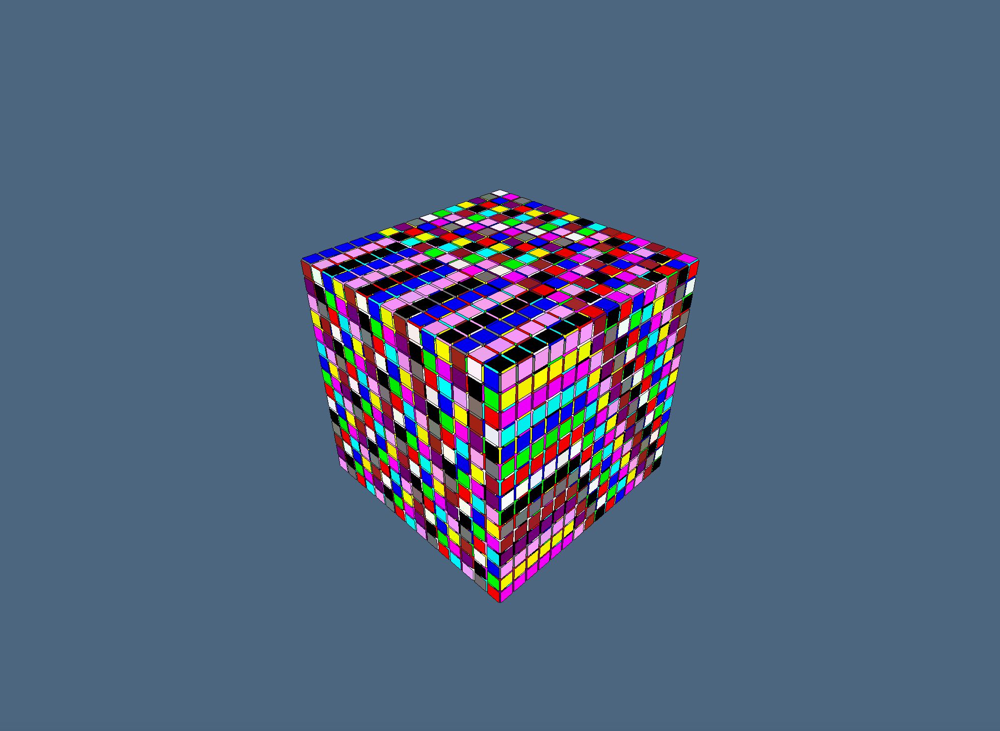

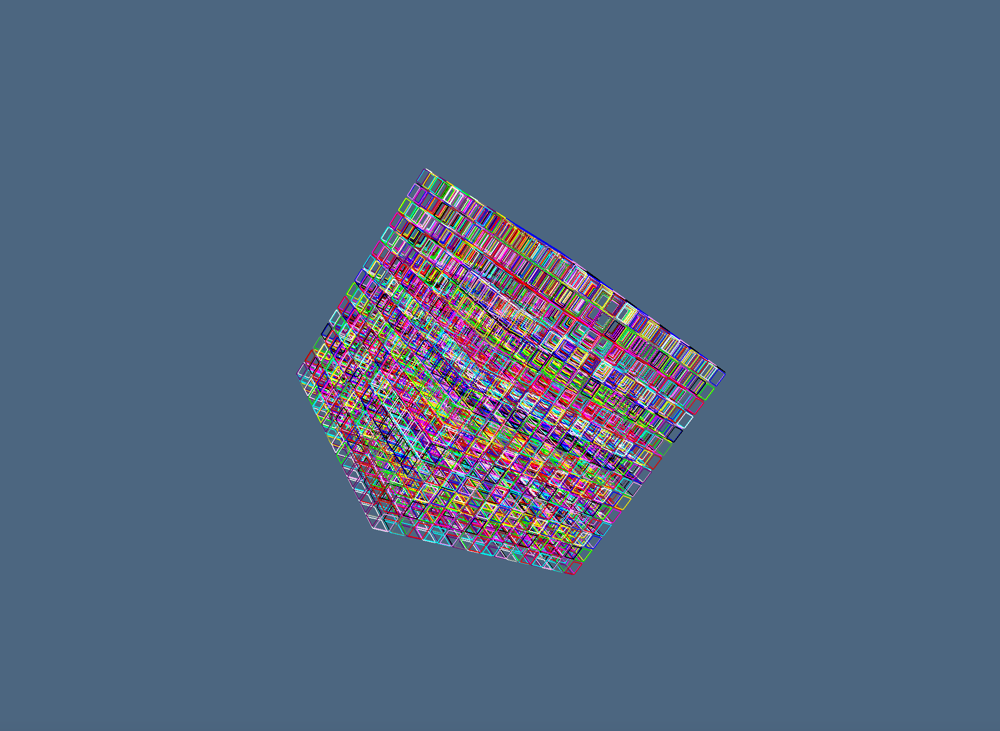

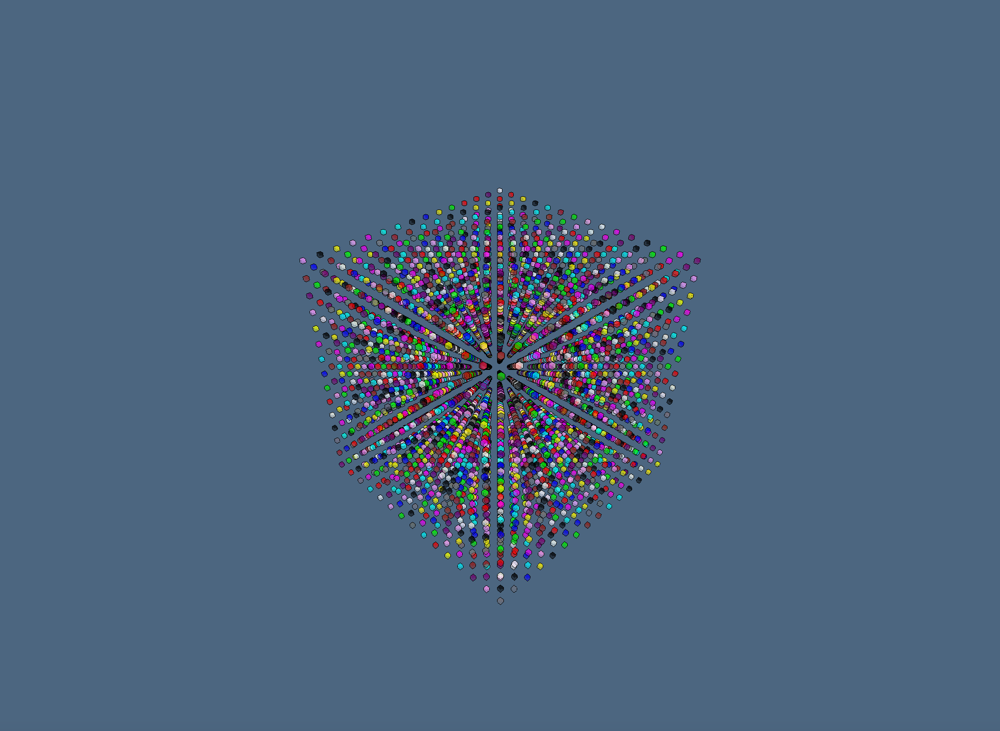

# <br><br><br><br><br><br><br><br><br><br><br><br><br><br><br>Example 7 - 100x50 cuboids table
### Cells number: 100x50 = 5000
Questo esempio è stato pensato per testare le performance della funzione **chainCongruence()** nella sua versione normale e quella che sfrutta i tasks: ci si aspetterebbe un miglioramento nella seconda versione poiché questa presenta una piccola porzione di codice che lavora in modo asincrono; tale porzione, però, viene richiamata un numero di volte elevato, pari al numero di vertici nella geometria, ed essendo questa geometria molto vasta (il numero di vertici è alto), i benefici previsti dovrebbero essere alti (o quantomeno presenti). Il miglioramento sulla seconda versione, però, non si verifica: questo è dovuto alla semplicità della porzione di codice chiamata; seppur essa sia chiamata un numero di volte elevato, essendo molto semplice, **risulta più complesso utilizzare la programmazione asincrona** (e quindi i tasks) **piuttosto che lavorare in modo seriale**; perciò, la versione normale di chainCongruence() è preferibile.

In [5]:
V1,(VV1,EV1,FV1,CV1) = Lar.cuboidGrid([100,50,1],true);
mybox1 = (V1,CV1,FV1,EV1);

allCubes = Lar.Struct([mybox1]);

In [6]:
V,CV,FV,EV = Lar.struct2lar(allCubes);

In [112]:
GL.VIEW([GL.GLGrid(V,EV, GL.COLORS[3], 0.5)]);

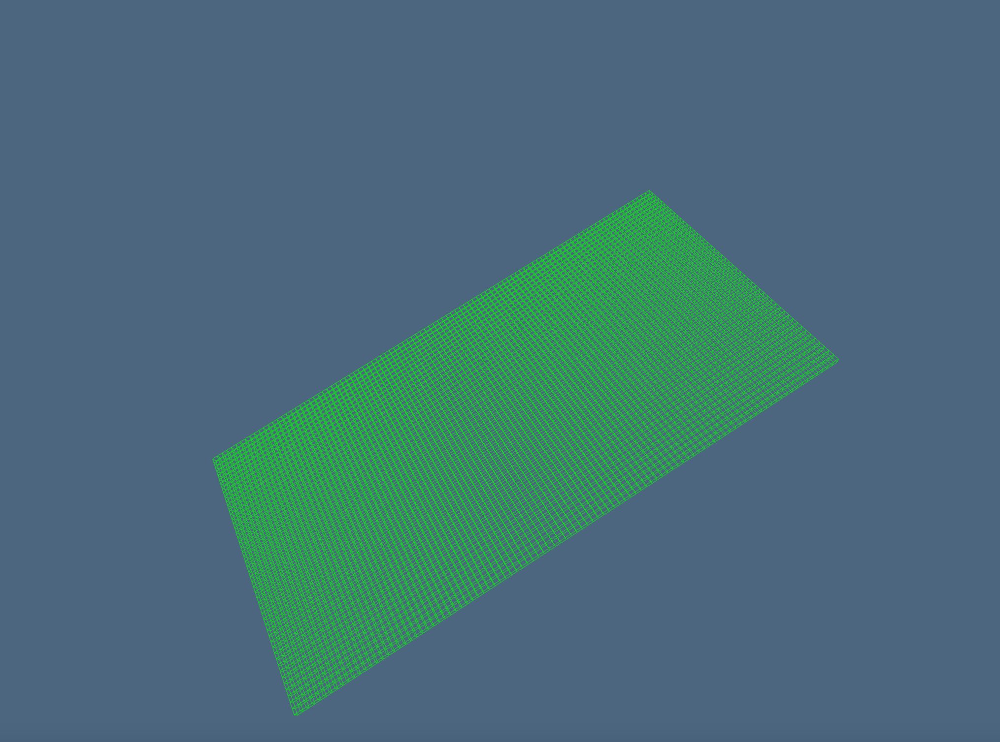

In [113]:
GL.VIEW([GL.GLGrid(V,FV, GL.COLORS[2], 0.5)]);

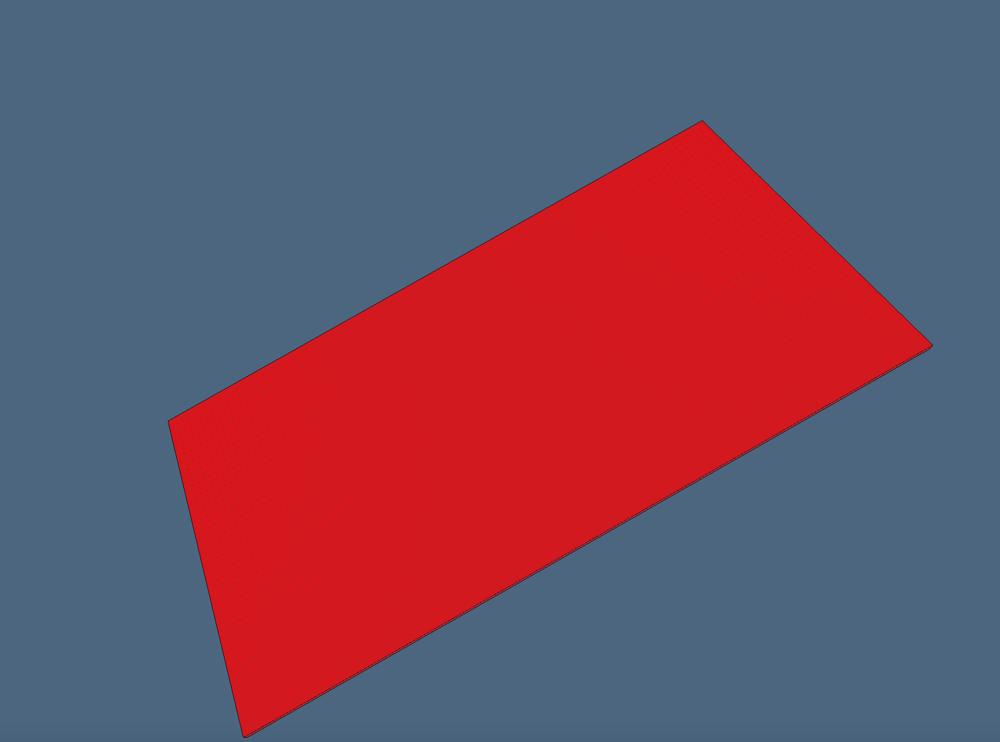

In [7]:
W = convert(Lar.Points, V');
cop_EV = Lar.coboundary_0(EV::Lar.Cells);
cop_EW = convert(Lar.ChainOp, cop_EV);
cop_FE = Lar.coboundary_1(V, FV::Lar.Cells, EV::Lar.Cells);
T = [cop_EV, cop_FE];

### Confronto fra la versione normale di chainCongruence() e quella asincrona (che sfrutta i tasks).
Come anticipato nella presentazione dell'esempio, ci si aspetterebbe un miglioramento, ma per via della semplicità della porzione di codice chiamata, risulta preferibile la versione normale. Tra l'altro, anche l'utilizzo di memoria è migliore nella versione normale: si passa da **60.38 MiB** della versione normale a **75.98 MiB** di quella modificata coi tasks; questo è dovuto alla porzione asincrona che richiede più risorse in parallelo.

In [10]:
@benchmark chainCongruenceAA(W, T)

BenchmarkTools.Trial: 2 samples with 1 evaluation.
 Range (min … max):  2.609 s …  2.621 s  ┊ GC (min … max): 0.00% … 0.49%
 Time  (median):     2.615 s             ┊ GC (median):    0.25%
 Time  (mean ± σ):   2.615 s ± 8.678 ms  ┊ GC (mean ± σ):  0.25% ± 0.35%

  █                                                      █  
  █▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█ ▁
  2.61 s        Histogram: frequency by time        2.62 s <

 Memory estimate: 60.38 MiB, allocs estimate: 1086761.

In [9]:
@benchmark chainCongruenceAA_OPT(W, T)

BenchmarkTools.Trial: 2 samples with 1 evaluation.
 Range (min … max):  2.646 s …    2.647 s  ┊ GC (min … max): 0.00% … 0.43%
 Time  (median):     2.647 s               ┊ GC (median):    0.21%
 Time  (mean ± σ):   2.647 s ± 686.230 μs  ┊ GC (mean ± σ):  0.21% ± 0.30%

  █                                                        █  
  █▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█ ▁
  2.65 s         Histogram: frequency by time         2.65 s <

 Memory estimate: 75.98 MiB, allocs estimate: 1255262.

#### Space arrangement e numerazione di vertici e facce della geometria

In [116]:
V, copEV, copFE, copCF = Lar.space_arrangement( W, cop_EW, cop_FE);

In [117]:
EV = Lar.cop2lar(copEV);
FE = Lar.cop2lar(copFE);
CF = Lar.cop2lar(copCF);
FV = [union([EV[e] for e in fe]...) for fe in FE];
CV = [union([FV[f] for f in cf]...) for cf in CF];
W = convert(Lar.Points, V');
WW = [[k] for k=1:size(W,2)];

In [118]:
GL.VIEW(GL.numbering(.5)((W,[WW,EV,FV,CV])));

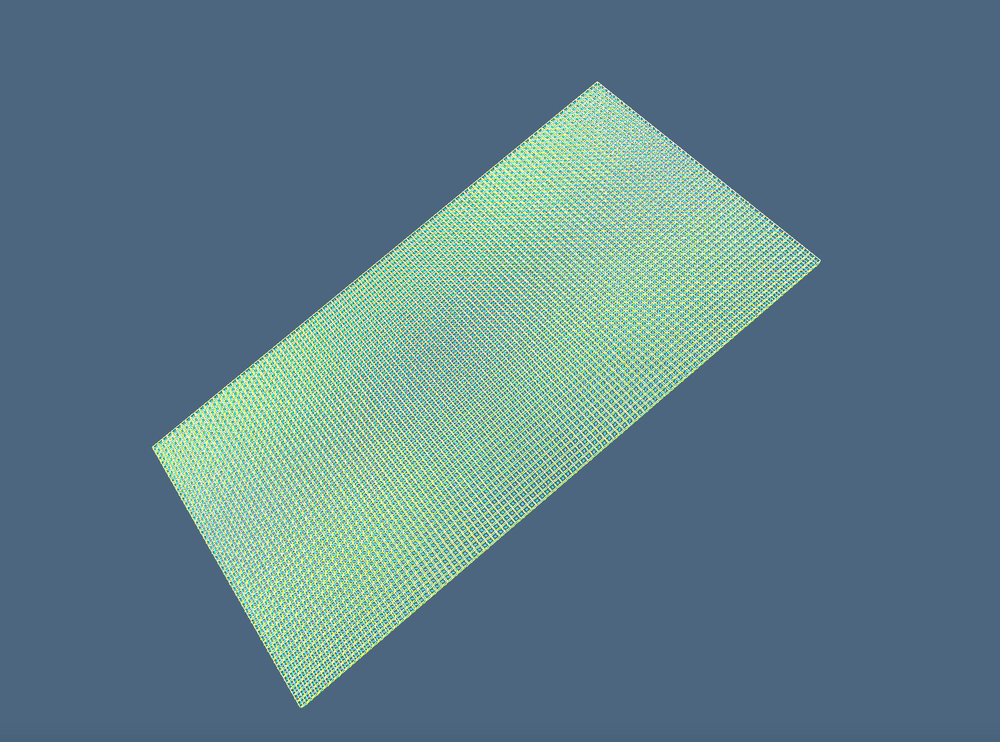

#### Rappresentazione finale dei vertici delle facce della geometria

In [119]:
V,CVs,FVs,EVs = Lar.pols2tria(W, copEV, copFE, copCF);

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

8, 2460]], [[2459, 2460], [2461, 2462], [2459, 2461], [2460, 2462]], [[2461, 2462], [2463, 2464], [2461, 2463], [2462, 2464]], [[2463, 2464], [2465, 2466], [2463, 2465], [2464, 2466]], [[2465, 2466], [2467, 2468], [2465, 2467], [2466, 2468]], [[2467, 2468], [2469, 2470], [2467, 2469], [2468, 2470]], [[2469, 2470], [2471, 2472], [2469, 2471], [2470, 2472]], [[2471, 2472], [2473, 2474], [2471, 2473], [2472, 2474]], [[2473, 2474], [2475, 2476], [2473, 2475], [2474, 2476]], [[2475, 2476], [2477, 2478], [2475, 2477], [2476, 2478]], [[2477, 2478], [2479, 2480], [2477, 2479], [2478, 2480]], [[2479, 2480], [2481, 2482], [2479, 2481], [2480, 2482]], [[2481, 2482], [2483, 2484], [2481, 2483], [2482, 2484]], [[2483, 2484], [2485, 2486], [2483, 2485], [2484, 2486]], [[2485, 2486], [2487, 2488], [2485, 2487], [2486, 2488]], [[2487, 2488], [2489, 2490], [2487, 2489], [2488, 2490]], [[2489, 2490], [2491, 2492], [2489, 2491], [2490, 2492]], [[2491, 2492], [2493, 2494], [2491, 2493], [2492, 2494]], [[2

[4762, 4764]], [[4763, 4764], [4765, 4766], [4763, 4765], [4764, 4766]], [[4765, 4766], [4767, 4768], [4765, 4767], [4766, 4768]], [[4767, 4768], [4769, 4770], [4767, 4769], [4768, 4770]], [[4769, 4770], [4771, 4772], [4769, 4771], [4770, 4772]], [[4771, 4772], [4773, 4774], [4771, 4773], [4772, 4774]], [[4773, 4774], [4775, 4776], [4773, 4775], [4774, 4776]], [[4775, 4776], [4777, 4778], [4775, 4777], [4776, 4778]], [[4777, 4778], [4779, 4780], [4777, 4779], [4778, 4780]], [[4779, 4780], [4781, 4782], [4779, 4781], [4780, 4782]], [[4781, 4782], [4783, 4784], [4781, 4783], [4782, 4784]], [[4783, 4784], [4785, 4786], [4783, 4785], [4784, 4786]], [[4785, 4786], [4787, 4788], [4785, 4787], [4786, 4788]], [[4787, 4788], [4789, 4790], [4787, 4789], [4788, 4790]], [[4789, 4790], [4791, 4792], [4789, 4791], [4790, 4792]], [[4791, 4792], [4793, 4794], [4791, 4793], [4792, 4794]], [[4795, 4796], [4797, 4798], [4795, 4797], [4796, 4798]], [[4797, 4798], [4799, 4800], [4797, 4799], [4798, 4800]],

9], [7068, 7070]], [[7069, 7070], [7071, 7072], [7069, 7071], [7070, 7072]], [[7071, 7072], [7073, 7074], [7071, 7073], [7072, 7074]], [[7073, 7074], [7075, 7076], [7073, 7075], [7074, 7076]], [[7075, 7076], [7077, 7078], [7075, 7077], [7076, 7078]], [[7077, 7078], [7079, 7080], [7077, 7079], [7078, 7080]], [[7079, 7080], [7081, 7082], [7079, 7081], [7080, 7082]], [[7081, 7082], [7083, 7084], [7081, 7083], [7082, 7084]], [[7083, 7084], [7085, 7086], [7083, 7085], [7084, 7086]], [[7085, 7086], [7087, 7088], [7085, 7087], [7086, 7088]], [[7087, 7088], [7089, 7090], [7087, 7089], [7088, 7090]], [[7089, 7090], [7091, 7092], [7089, 7091], [7090, 7092]], [[7091, 7092], [7093, 7094], [7091, 7093], [7092, 7094]], [[7093, 7094], [7095, 7096], [7093, 7095], [7094, 7096]], [[7095, 7096], [7097, 7098], [7095, 7097], [7096, 7098]], [[7097, 7098], [7099, 7100], [7097, 7099], [7098, 7100]], [[7099, 7100], [7101, 7102], [7099, 7101], [7100, 7102]], [[7101, 7102], [7103, 7104], [7101, 7103], [7102, 710

 9373], [9372, 9374]], [[9373, 9374], [9375, 9376], [9373, 9375], [9374, 9376]], [[9375, 9376], [9377, 9378], [9375, 9377], [9376, 9378]], [[9377, 9378], [9379, 9380], [9377, 9379], [9378, 9380]], [[9379, 9380], [9381, 9382], [9379, 9381], [9380, 9382]], [[9381, 9382], [9383, 9384], [9381, 9383], [9382, 9384]], [[9385, 9386], [9387, 9388], [9385, 9387], [9386, 9388]], [[9387, 9388], [9389, 9390], [9387, 9389], [9388, 9390]], [[9389, 9390], [9391, 9392], [9389, 9391], [9390, 9392]], [[9391, 9392], [9393, 9394], [9391, 9393], [9392, 9394]], [[9393, 9394], [9395, 9396], [9393, 9395], [9394, 9396]], [[9395, 9396], [9397, 9398], [9395, 9397], [9396, 9398]], [[9397, 9398], [9399, 9400], [9397, 9399], [9398, 9400]], [[9399, 9400], [9401, 9402], [9399, 9401], [9400, 9402]], [[9401, 9402], [9403, 9404], [9401, 9403], [9402, 9404]], [[9403, 9404], [9405, 9406], [9403, 9405], [9404, 9406]], [[9405, 9406], [9407, 9408], [9405, 9407], [9406, 9408]], [[9407, 9408], [9409, 9410], [9407, 9409], [9408,

7, 1448], [1549, 1550], [1447, 1549], [1448, 1550]], [[1449, 1450], [1551, 1552], [1449, 1551], [1450, 1552]], [[1451, 1452], [1553, 1554], [1451, 1553], [1452, 1554]], [[1453, 1454], [1555, 1556], [1453, 1555], [1454, 1556]], [[1455, 1456], [1557, 1558], [1455, 1557], [1456, 1558]], [[1457, 1458], [1559, 1560], [1457, 1559], [1458, 1560]], [[1459, 1460], [1561, 1562], [1459, 1561], [1460, 1562]], [[1461, 1462], [1563, 1564], [1461, 1563], [1462, 1564]], [[1463, 1464], [1565, 1566], [1463, 1565], [1464, 1566]], [[1465, 1466], [1567, 1568], [1465, 1567], [1466, 1568]], [[1467, 1468], [1569, 1570], [1467, 1569], [1468, 1570]], [[1469, 1470], [1571, 1572], [1469, 1571], [1470, 1572]], [[1471, 1472], [1573, 1574], [1471, 1573], [1472, 1574]], [[1473, 1474], [1575, 1576], [1473, 1575], [1474, 1576]], [[1475, 1476], [1577, 1578], [1475, 1577], [1476, 1578]], [[1477, 1478], [1579, 1580], [1477, 1579], [1478, 1580]], [[1479, 1480], [1581, 1582], [1479, 1581], [1480, 1582]], [[1481, 1482], [158

[3707, 3708], [3809, 3810], [3707, 3809], [3708, 3810]], [[3709, 3710], [3811, 3812], [3709, 3811], [3710, 3812]], [[3711, 3712], [3813, 3814], [3711, 3813], [3712, 3814]], [[3713, 3714], [3815, 3816], [3713, 3815], [3714, 3816]], [[3715, 3716], [3817, 3818], [3715, 3817], [3716, 3818]], [[3717, 3718], [3819, 3820], [3717, 3819], [3718, 3820]], [[3719, 3720], [3821, 3822], [3719, 3821], [3720, 3822]], [[3721, 3722], [3823, 3824], [3721, 3823], [3722, 3824]], [[3723, 3724], [3825, 3826], [3723, 3825], [3724, 3826]], [[3725, 3726], [3827, 3828], [3725, 3827], [3726, 3828]], [[3727, 3728], [3829, 3830], [3727, 3829], [3728, 3830]], [[3729, 3730], [3831, 3832], [3729, 3831], [3730, 3832]], [[3731, 3732], [3833, 3834], [3731, 3833], [3732, 3834]], [[3733, 3734], [3835, 3836], [3733, 3835], [3734, 3836]], [[3735, 3736], [3837, 3838], [3735, 3837], [3736, 3838]], [[3737, 3738], [3839, 3840], [3737, 3839], [3738, 3840]], [[3739, 3740], [3841, 3842], [3739, 3841], [3740, 3842]], [[3741, 3742], 

Excessive output truncated after 526309 bytes.

In [120]:
GL.VIEW(GL.GLExplode(V,FVs,1.2,1.2,1.2,99,1));
GL.VIEW(GL.GLExplode(V,EVs,1.2,1.2,1.2,99,1));
GL.VIEW(GL.GLExplode(V,CVs[2:end],5,5,5,99,0.5));

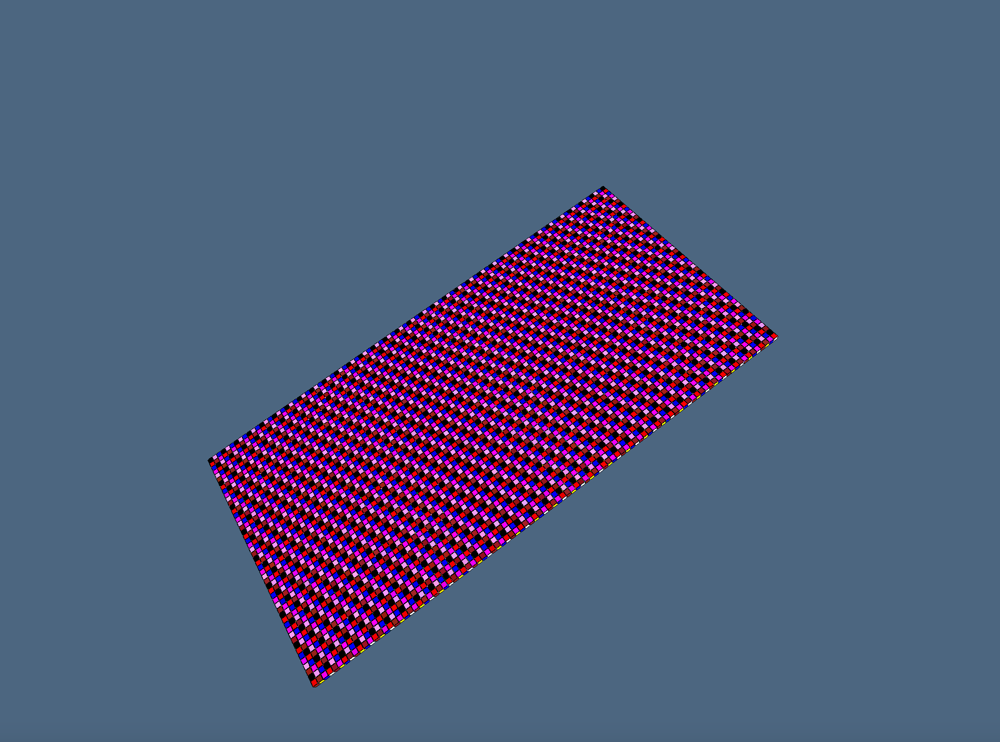

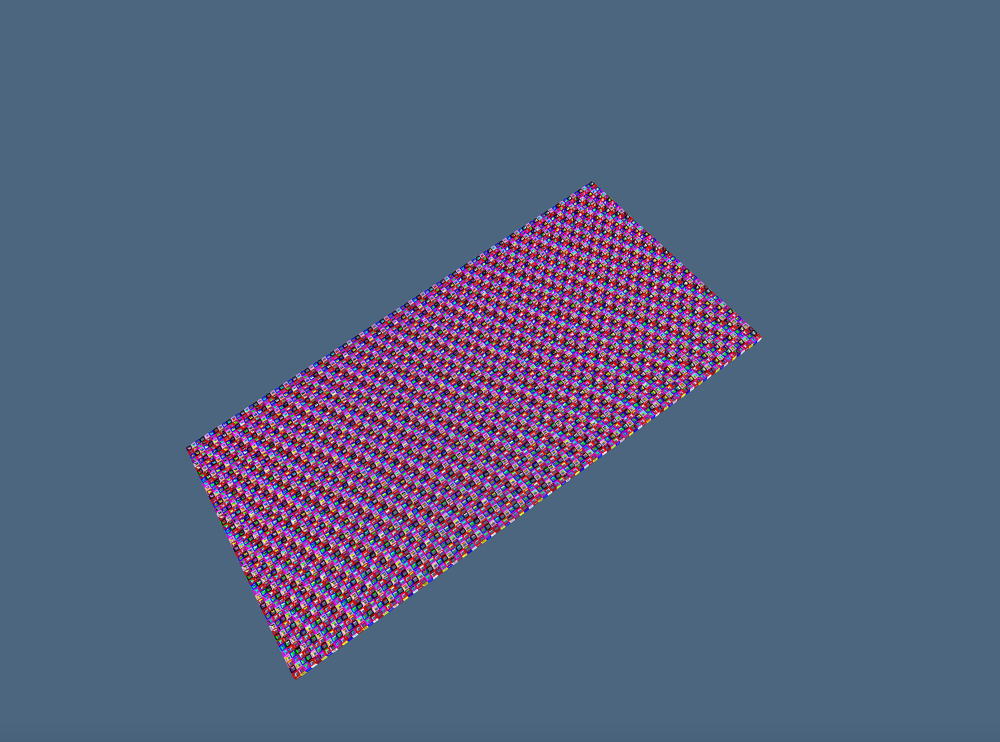

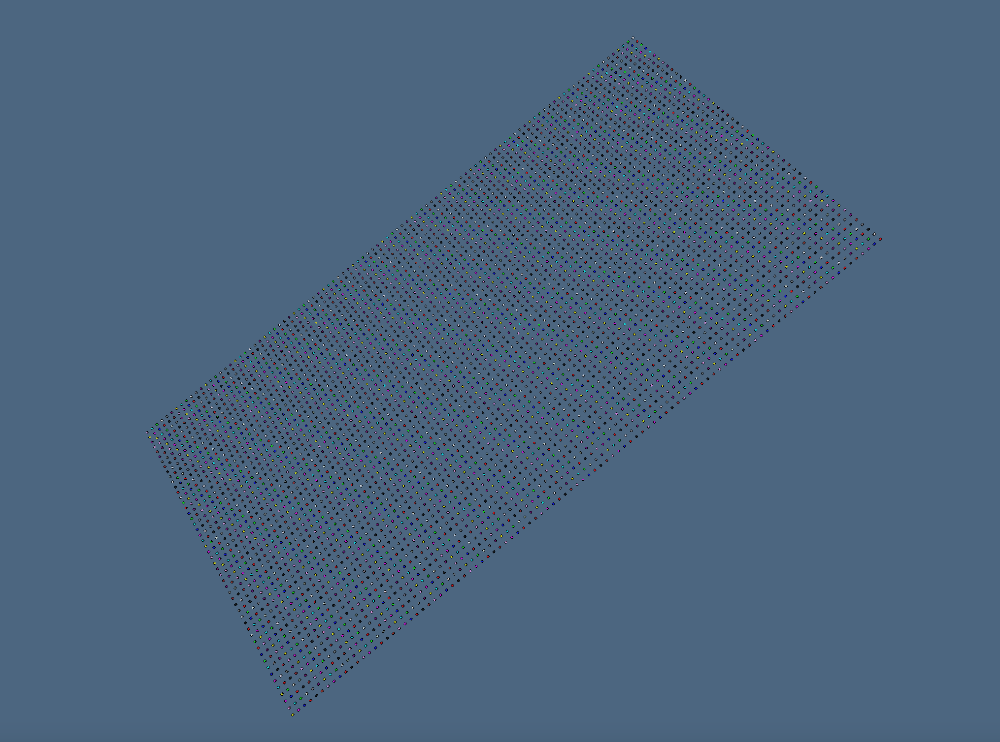

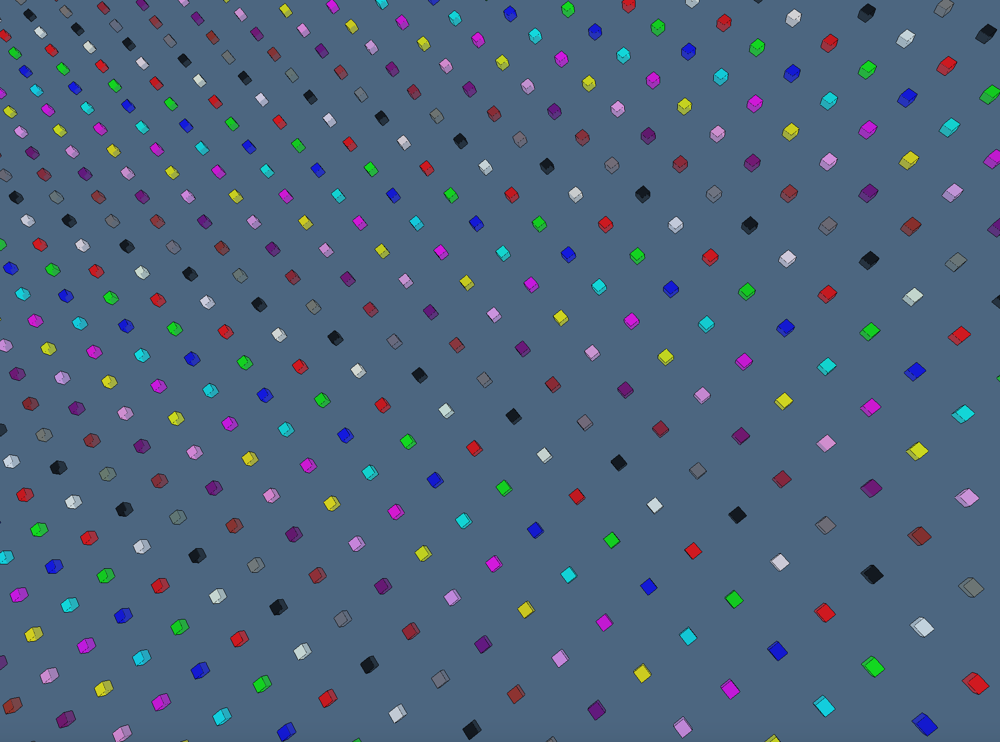